## SA2 Mini Project


#### Submitted By: Amit Kumar Sharma


##### Group: <br>
Amit Kumar Sharma (PGID: 71721079) <br>
Arun Vasa<br>
Devarakumar Sri Seshagiri Paluri <br>

##### Problem Description:<br>
Communities and Crime

##### Abstract: 

Communities within the United States. The data combines socio-economic data from the 1990 US Census, law enforcement data from the 1990 US LEMAS survey, and crime data from the 1995 FBI UCR.

#####  Source:

Creator: Michael Redmond (redmond 'at' lasalle.edu); Computer Science; La Salle University; Philadelphia, PA, 19141, USA<br>
-- culled from 1990 US Census, 1995 US FBI Uniform Crime Report, 1990 US Law Enforcement Management and Administrative Statistics Survey, available from ICPSR at U of Michigan.<br>
-- Donor: Michael Redmond (redmond 'at' lasalle.edu); Computer Science; La Salle University; Philadelphia, PA, 19141, USA<br>

##### Communities's data set<br>
Consider the Community dataset (community_data.csv) attached. This data Set combines socio-economic data from the 1990 US Census, law enforcement data from the 1990 US LEMAS survey, and Crime data from the 1995 FBI UCR.  This Data set contains 1994 rows and 128 columns. Description of attributes given in the folder. Many variables are included so that select or learn weights for attributes to undergo further analysis. Using the dataset, perform an exploratory data analysis (EDA) and also build a model which can predict the per capita violent crimes).


##### Assumption:

##### Final Model:

model4.2 = lm(formula = I(ViolentCrimesPerPop^0.35) ~ population + householdsize + 
    racepctblack + racePctAsian + racePctHisp + agePct12t29 + 
    agePct65up + pctUrban + pctWWage + pctWFarmSelf + pctWInvInc + 
    pctWRetire + medFamInc + perCapInc + blackPerCap + AsianPerCap + 
    PctPopUnderPov + PctEmploy + PctEmplManu + PctEmplProfServ + 
    MalePctDivorce + MalePctNevMarr + PersPerFam + PctFam2Par + 
    PctYoungKids2Par + PctWorkMom + NumIlleg + NumImmig + PctRecImmig8 + 
    PctRecImmig10 + PctNotSpeakEnglWell + PersPerOccupHous + 
    PersPerRentOccHous + PctPersOwnOccup + PctPersDenseHous + 
    PctHousOccup + PctHousOwnOcc + PctVacMore6Mos + PctWOFullPlumb + 
    OwnOccLowQuart + OwnOccHiQuart + RentLowQ + MedRent + MedRentPctHousInc + 
    MedOwnCostPctIncNoMtg + NumInShelters + NumStreet + PctForeignBorn + 
    PctSameCity85 + PopDens + PctUsePubTrans + LemasPctOfficDrugUn + 
    blackPerCap_sq + NumStreet_sq + pctWFarmSelf_sq + PctYoungKids2Par_sq + 
    NumImmig_sq + PctVacMore6Mos_sq + PctWOFullPlumb_sq + MedRentPctHousInc_sq + 
    PopDens_sq + LemasPctOfficDrugUn_sq, data = trainingData1)
  

##### Final Model Statitics:

R-Square :  74.58% <br>
RMSE for validation data:  0.11405979773682<br>
R-Square for validation data:  0.759974531525303

##### Other Models:

###### PCR

We used 20 Principle components to predict ViolentCrimesPerPop for validation data.<br>
RMSE for this model is: 0.145736981512293

###### Ridge

best lambda:  0.0196460779345214<br>
RMSE:  0.135436414052163<br>
R Square:  0.64342942147755<br>

###### Lasso

best lambda:  0.000614080571841437<br>
RMSE:  0.135696178773185<br>
R Square:  0.642060317258955<br>


In [2]:
library(car)
library(MASS)
library(tidyverse)
library(dplyr)
library(ggplot2)
library(corrplot)
library(perturb)
library(reshape2)
library(ggplot2)
library(caret)
library(pcr)
library(pls)
library(glmnet)
set.seed (1000)

In [3]:
data = read.csv("/Users/a5sharma/Documents/ISB/SA2/Project/Datasets/CommunitiesData/community_data.csv",
                header = T,sep=",",stringsAsFactors = F, na.strings = c("NA", "N/A", "?",""))
head(data)

state,county,community,communityname,fold,population,householdsize,racepctblack,racePctWhite,racePctAsian,⋯,LandArea,PopDens,PctUsePubTrans,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,ViolentCrimesPerPop
8,NA,NA,Lakewoodcity,1,0.19,0.33,0.02,0.90,0.12,⋯,0.12,0.26,0.20,0.06,0.04,0.9,0.5,0.32,0.14,0.20
53,NA,NA,Tukwilacity,1,0.00,0.16,0.12,0.74,0.45,⋯,0.02,0.12,0.45,NA,NA,NA,NA,0.00,NA,0.67
24,NA,NA,Aberdeentown,1,0.00,0.42,0.49,0.56,0.17,⋯,0.01,0.21,0.02,NA,NA,NA,NA,0.00,NA,0.43
34,5,81440,Willingborotownship,1,0.04,0.77,1.00,0.08,0.12,⋯,0.02,0.39,0.28,NA,NA,NA,NA,0.00,NA,0.12
42,95,6096,Bethlehemtownship,1,0.01,0.55,0.02,0.95,0.09,⋯,0.04,0.09,0.02,NA,NA,NA,NA,0.00,NA,0.03
6,NA,NA,SouthPasadenacity,1,0.02,0.28,0.06,0.54,1.00,⋯,0.01,0.58,0.10,NA,NA,NA,NA,0.00,NA,0.14


As following features are nominal features and following fetaures are not predictive features as per communities.names.txt file.

-- state: US state (by number) - not counted as predictive above, but if considered, should be consided nominal (nominal)<br>
-- county: numeric code for county - not predictive, and many missing values (numeric)<br>
-- community: numeric code for community - not predictive and many missing values (numeric)<br>
-- communityname: community name - not predictive - for information only (string)<br>
-- fold: fold number for non-random 10 fold cross validation, potentially useful for debugging, paired tests - not predictive (numeric)

Removing above mentioned features from the data frame.

In [4]:
data <- data[,-c(1,2,3,4,5)]

### Missing Data Treatment

There are many features which are having more than 70% missing values. Hence, removing all the features which are having more than 70% missing data.

In [5]:
n <- nrow(data)
features_need_to_deleted <- NULL
for (i in seq(1:length(data))){
  n_of_nul <- sum(is.na(data[,i]))
  if (n_of_nul/n > 0.7){
    features_need_to_deleted<-c(features_need_to_deleted,paste(as.integer(i)))
  }
}
features_need_to_deleted <- as.numeric(features_need_to_deleted)
Ndata <- data[, -c(features_need_to_deleted)]

Still there is missing data in OtherPerCap variable (only 1 observation).

In [6]:
for (i in seq(1:length(Ndata))){
    no_of_nul <- sum(is.na(Ndata[,i]))
    if(no_of_nul > 0){
        print(paste(colnames(Ndata)[i], no_of_nul))
    }
}

[1] "OtherPerCap 1"


Impute missing data with mean.

In [7]:
print(paste("Mean of OtherPerCap: ", mean(Ndata$OtherPerCap, na.rm=TRUE)))
Ndata$OtherPerCap[is.na(Ndata$OtherPerCap)] = mean(Ndata$OtherPerCap, na.rm=TRUE)

[1] "Mean of OtherPerCap:  0.284741595584546"


In [8]:
for (i in seq(1:length(Ndata))){
    no_of_nul <- sum(is.na(Ndata[,i]))
    if(no_of_nul > 0){
        print(i)
        print(no_of_nul)
    }
}

## Exploratory data analysis

In [9]:
summary(Ndata)

   population      householdsize     racepctblack     racePctWhite   
 Min.   :0.00000   Min.   :0.0000   Min.   :0.0000   Min.   :0.0000  
 1st Qu.:0.01000   1st Qu.:0.3500   1st Qu.:0.0200   1st Qu.:0.6300  
 Median :0.02000   Median :0.4400   Median :0.0600   Median :0.8500  
 Mean   :0.05759   Mean   :0.4634   Mean   :0.1796   Mean   :0.7537  
 3rd Qu.:0.05000   3rd Qu.:0.5400   3rd Qu.:0.2300   3rd Qu.:0.9400  
 Max.   :1.00000   Max.   :1.0000   Max.   :1.0000   Max.   :1.0000  
  racePctAsian     racePctHisp     agePct12t21      agePct12t29    
 Min.   :0.0000   Min.   :0.000   Min.   :0.0000   Min.   :0.0000  
 1st Qu.:0.0400   1st Qu.:0.010   1st Qu.:0.3400   1st Qu.:0.4100  
 Median :0.0700   Median :0.040   Median :0.4000   Median :0.4800  
 Mean   :0.1537   Mean   :0.144   Mean   :0.4242   Mean   :0.4939  
 3rd Qu.:0.1700   3rd Qu.:0.160   3rd Qu.:0.4700   3rd Qu.:0.5400  
 Max.   :1.0000   Max.   :1.000   Max.   :1.0000   Max.   :1.0000  
  agePct16t24       agePct65up    

We can see that from the below density plot that ViolentCrimesPerPop is skewed to right.

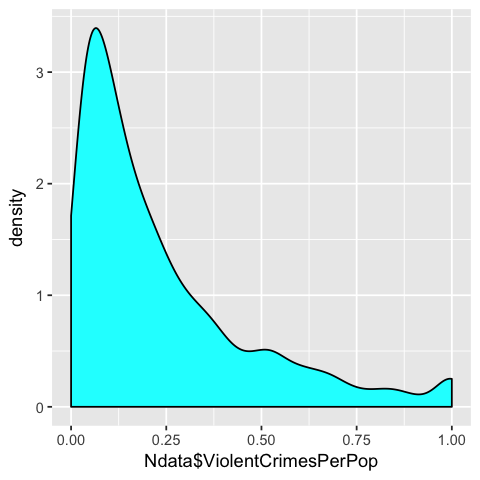

In [10]:
options(repr.plot.width=4, repr.plot.height=4)
ggplot(Ndata,aes(x=Ndata$ViolentCrimesPerPop))+geom_density(fill="cyan")

From the below boxplot, we can see that some variables are skewed to right and some variables are skewed to left. Also, we can see some variables have lot's of outliers.

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

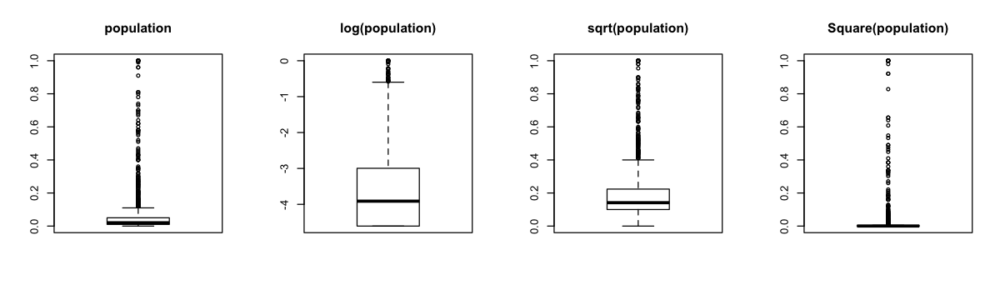

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

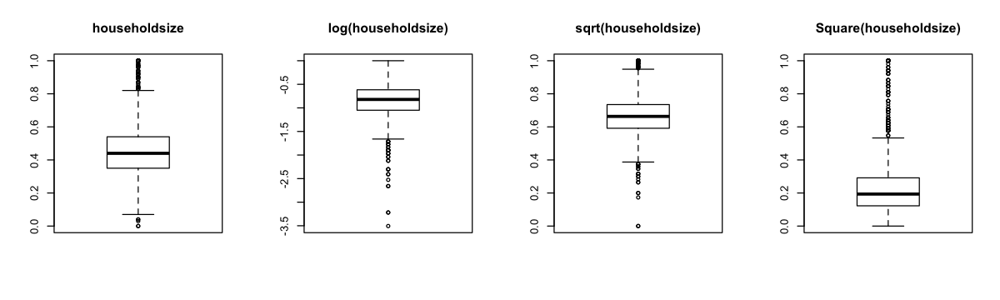

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

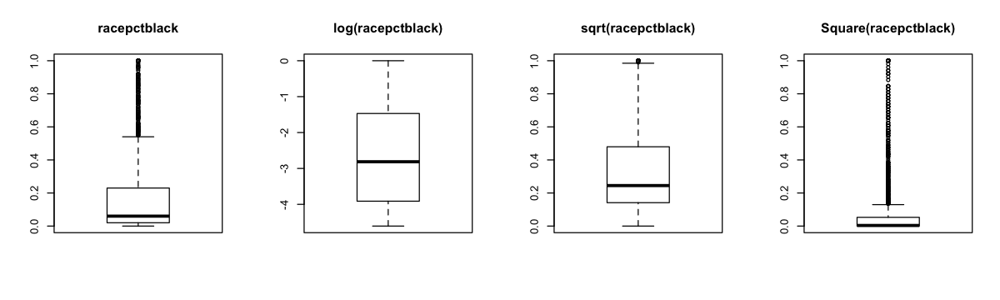

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

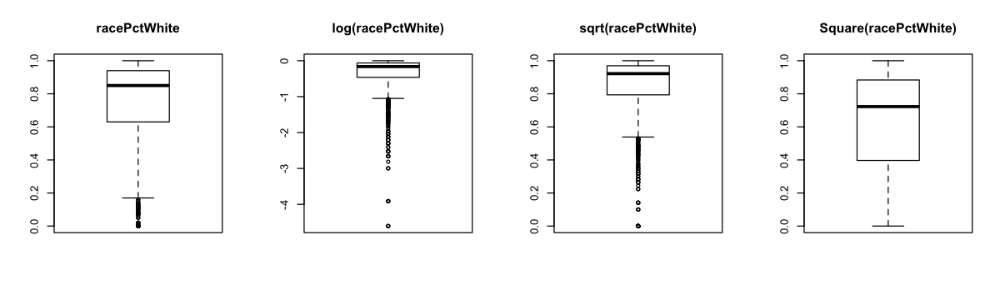

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

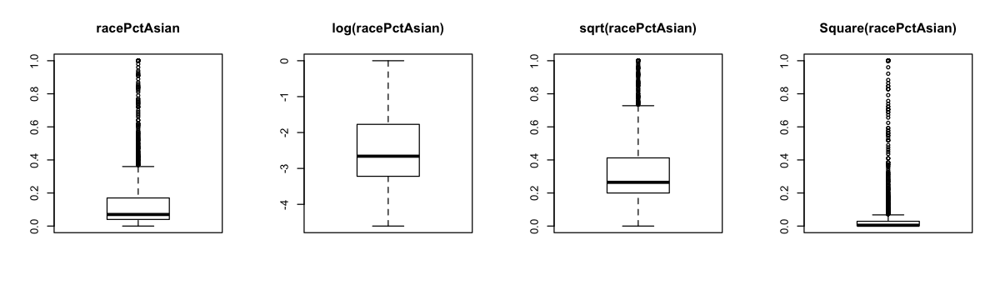

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

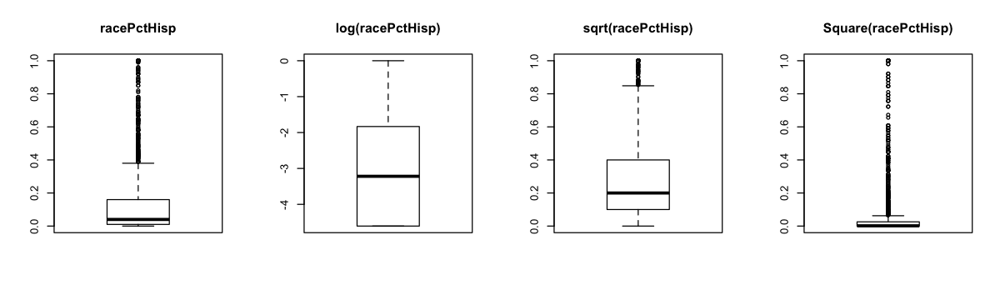

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

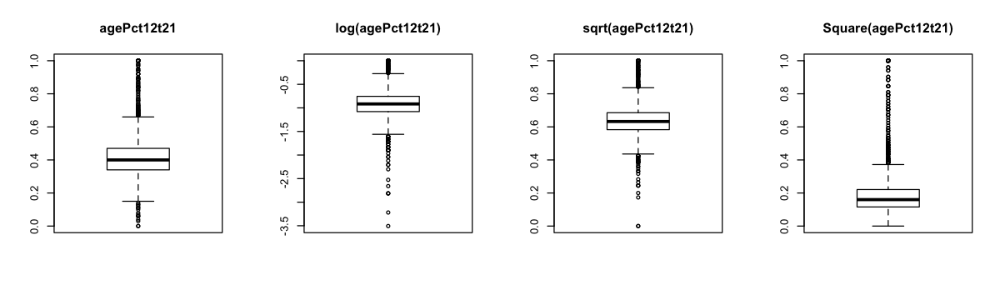

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

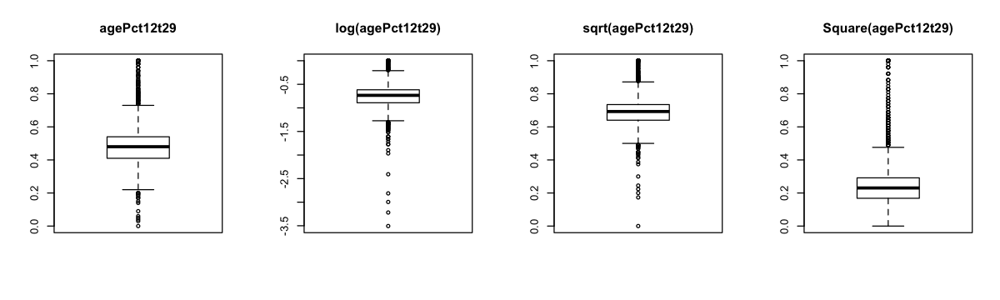

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

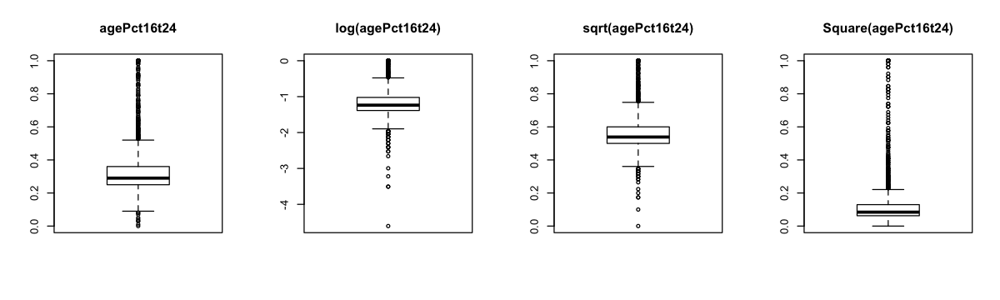

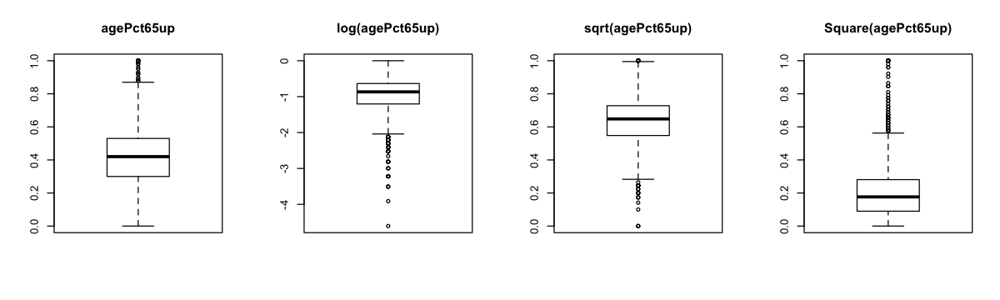

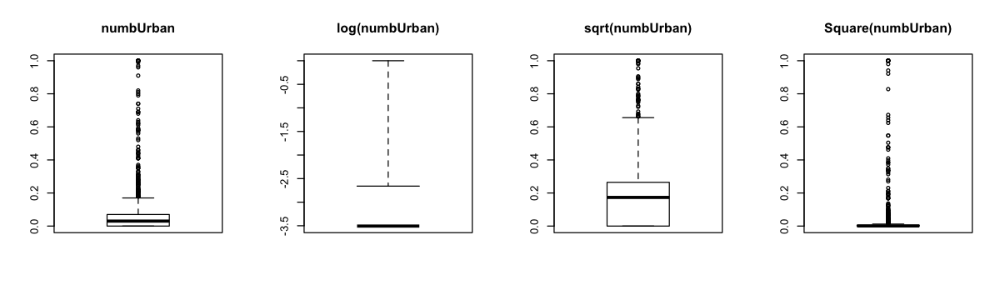

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

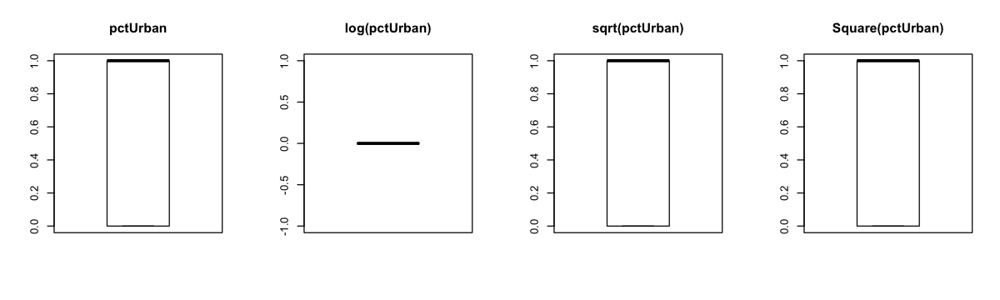

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

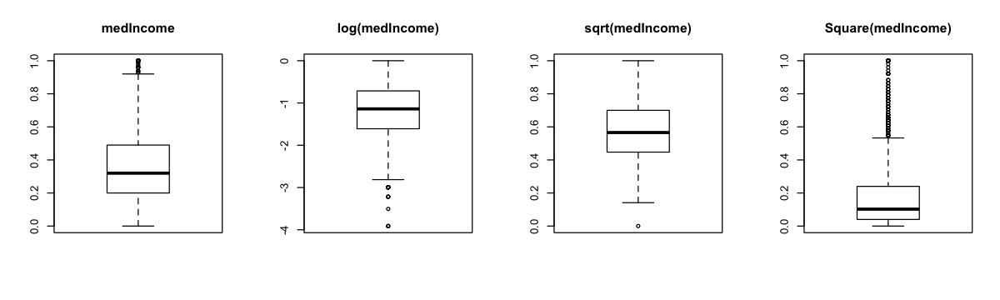

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

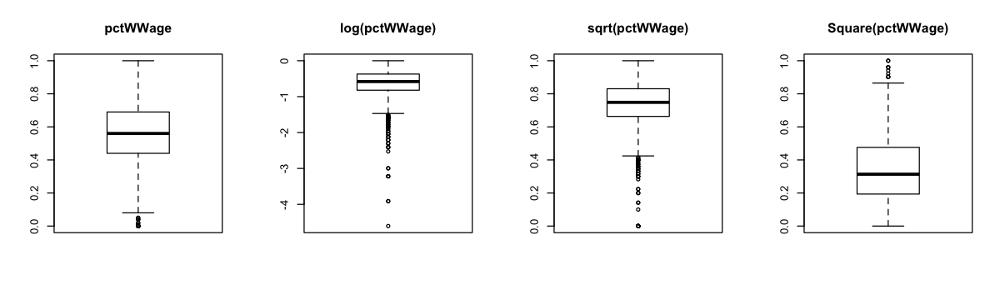

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

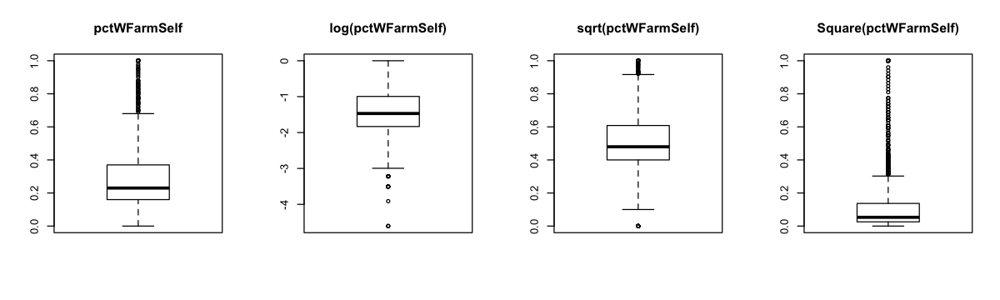

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

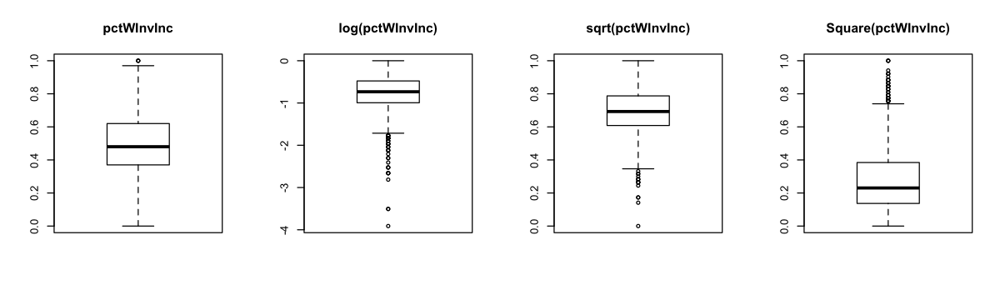

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

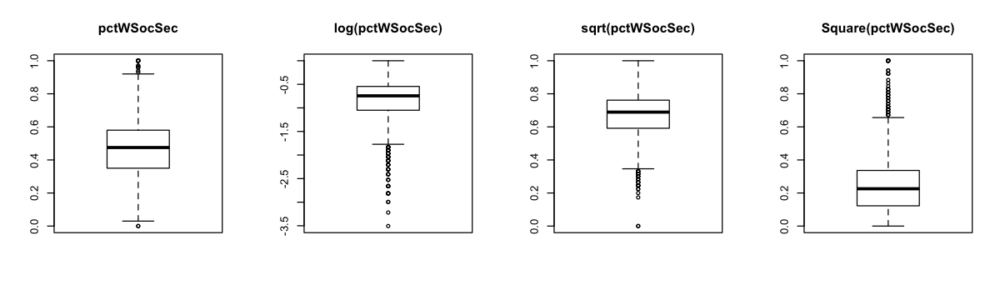

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

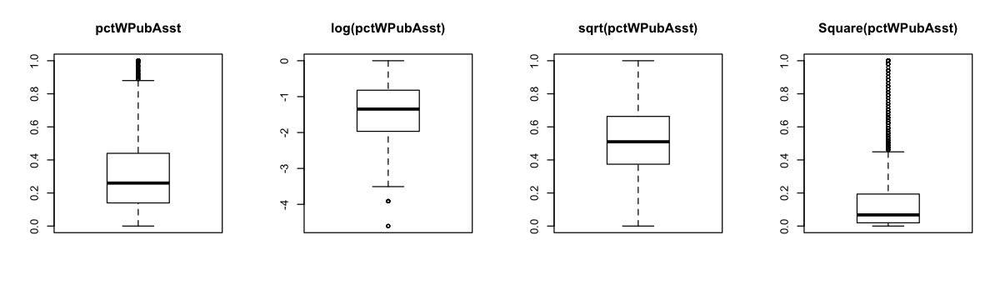

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

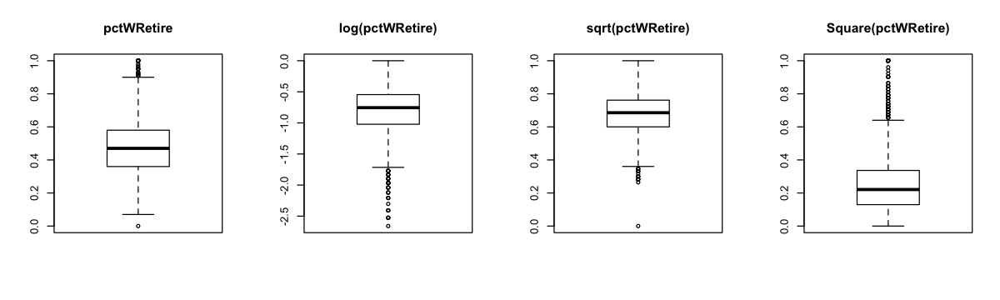

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

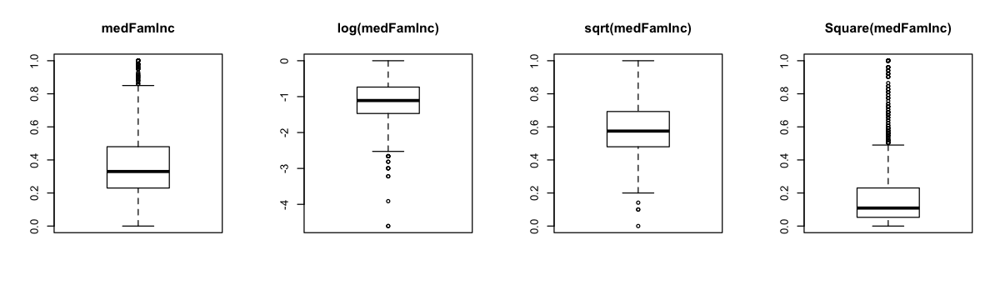

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

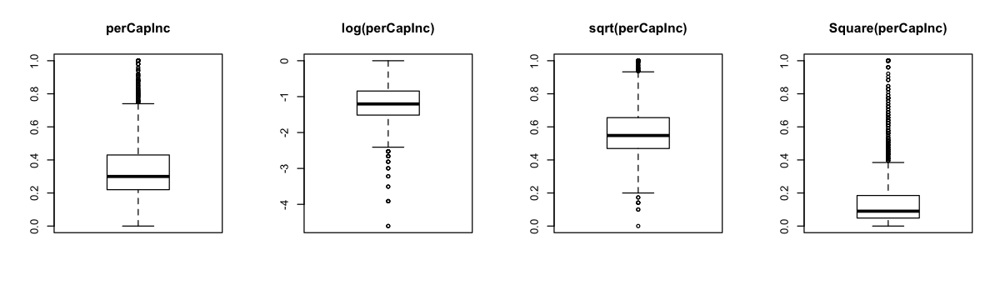

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

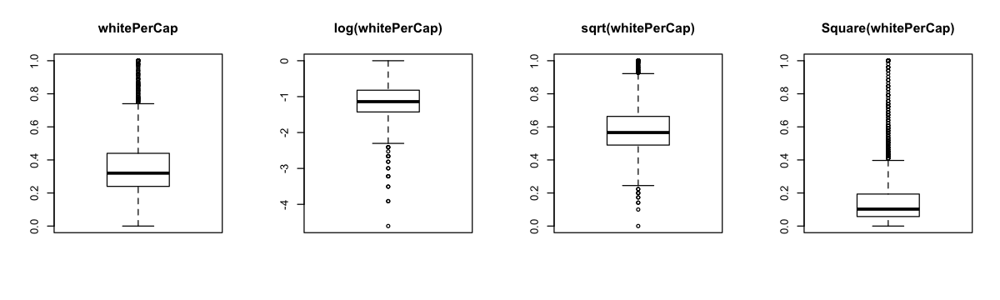

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

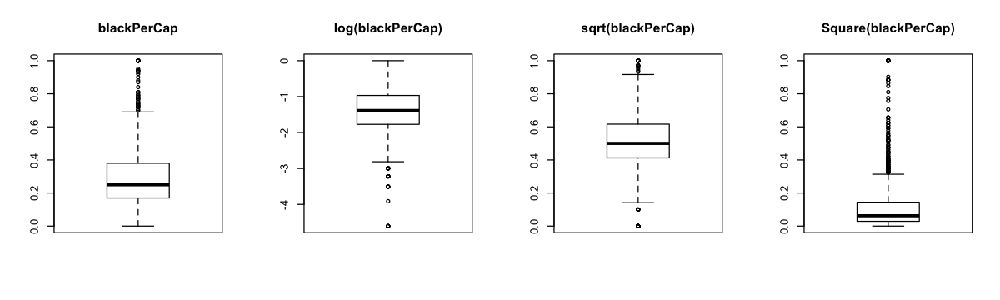

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

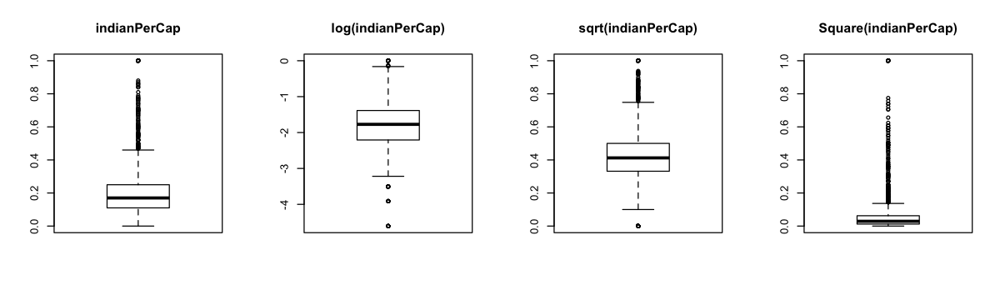

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

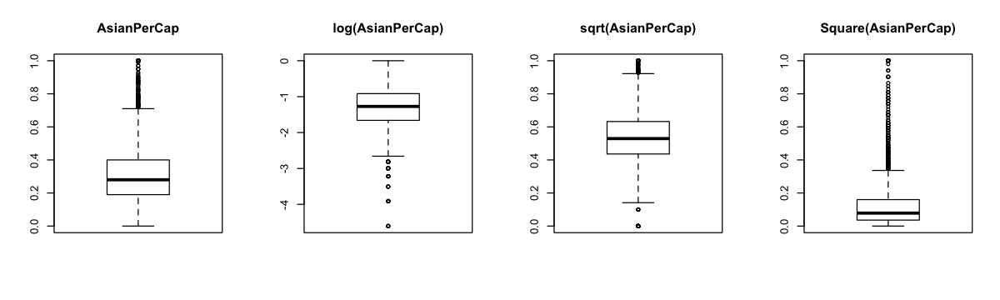

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

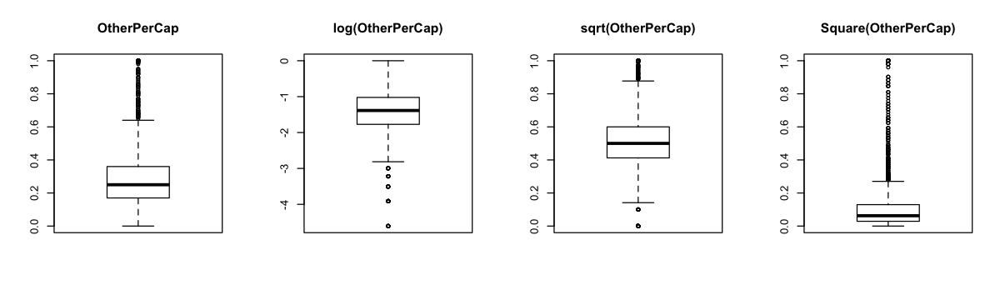

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

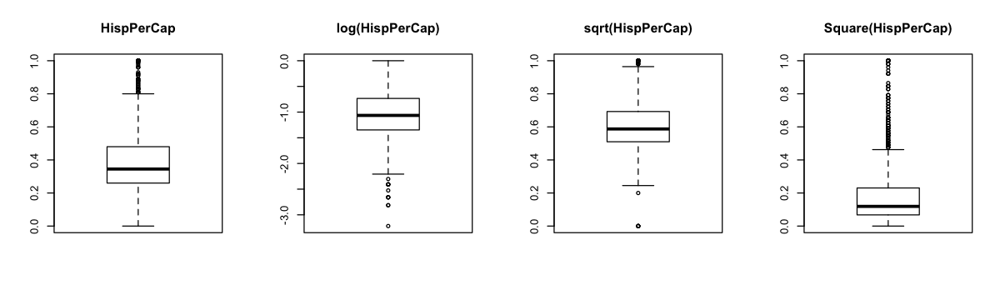

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

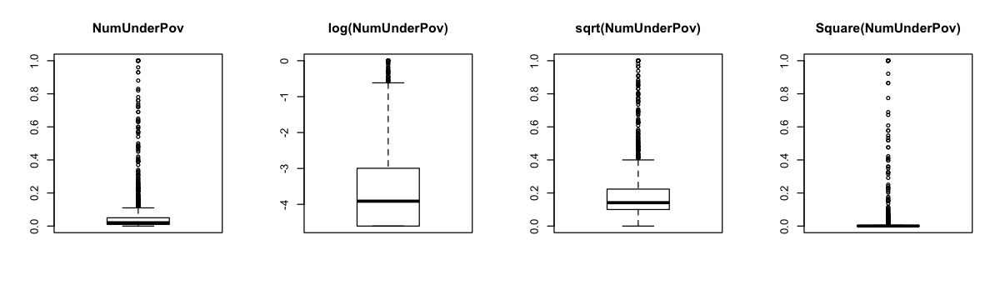

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

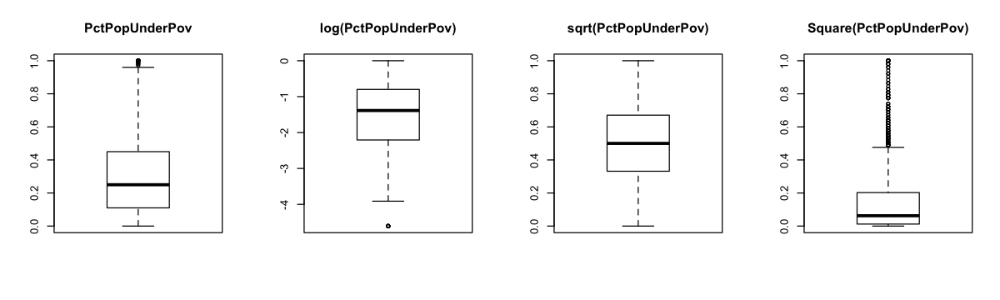

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

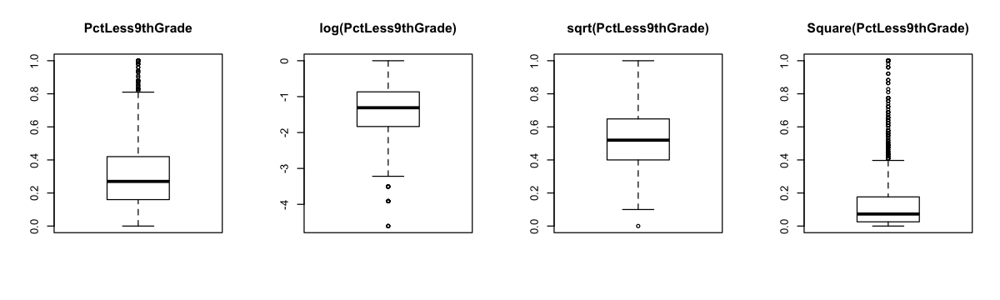

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

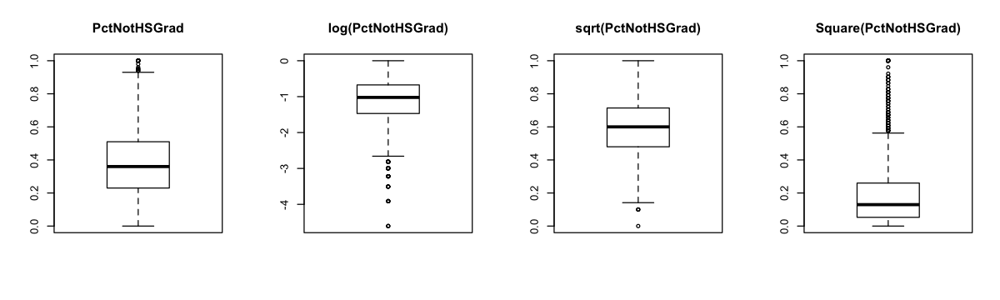

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

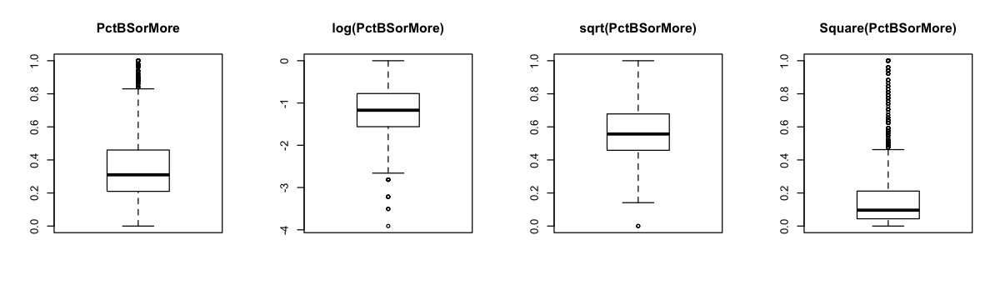

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

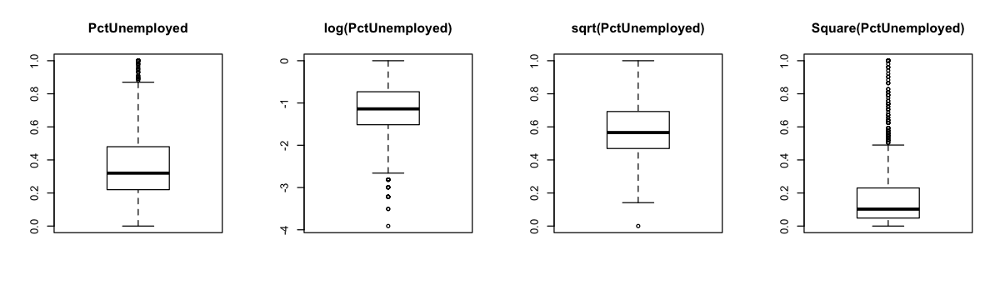

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

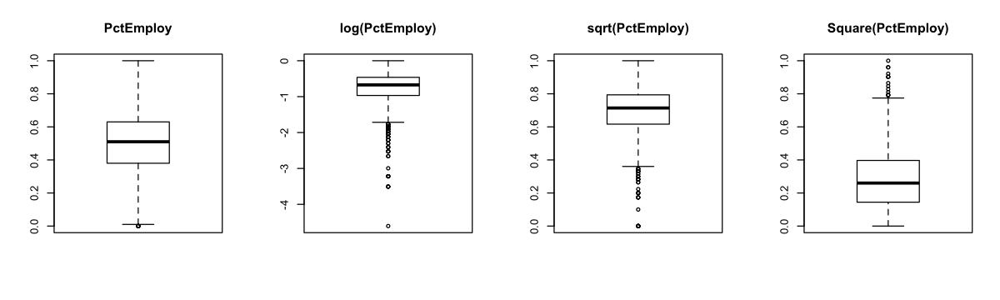

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

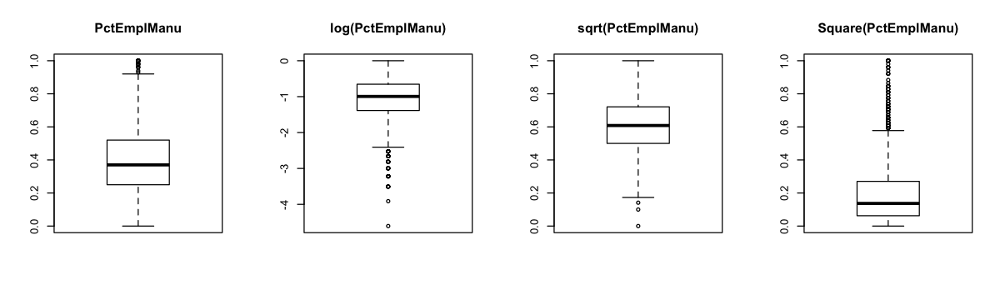

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

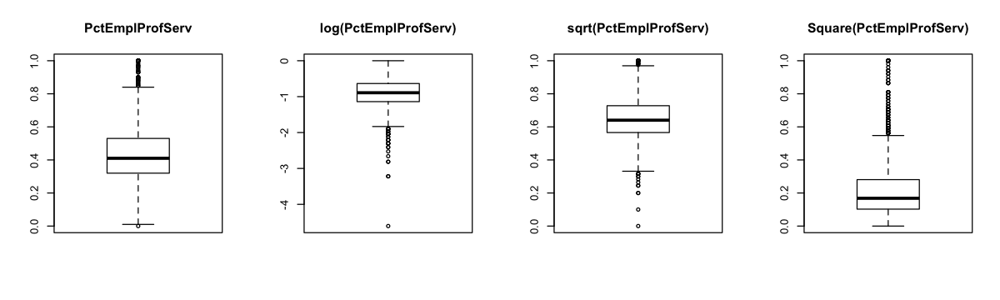

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

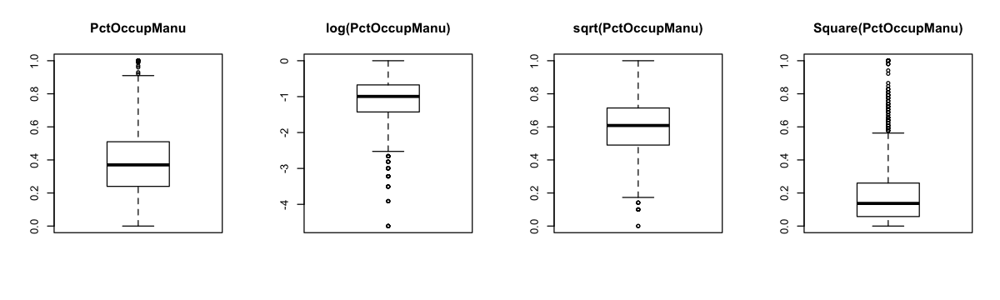

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

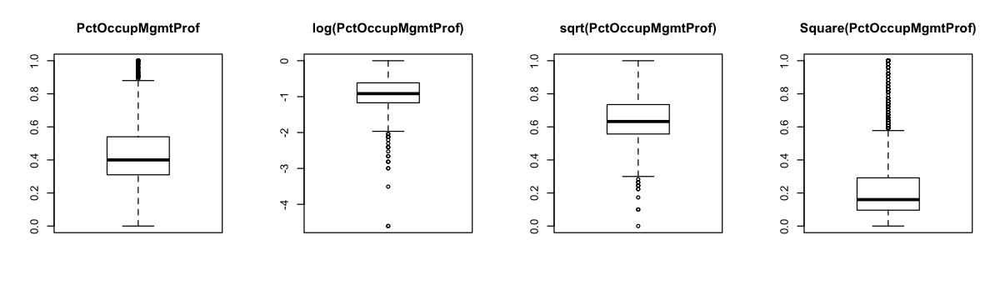

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

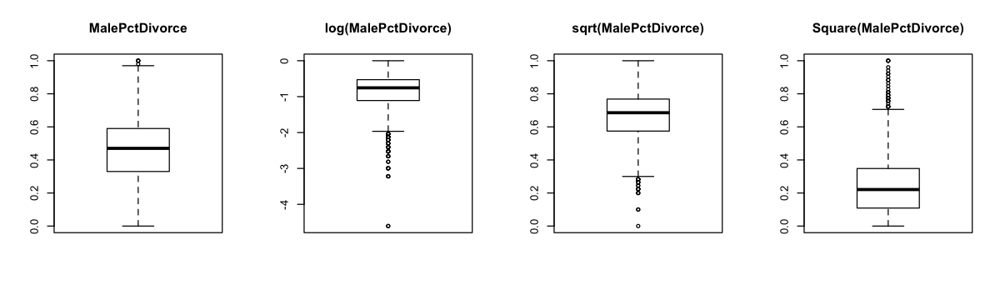

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

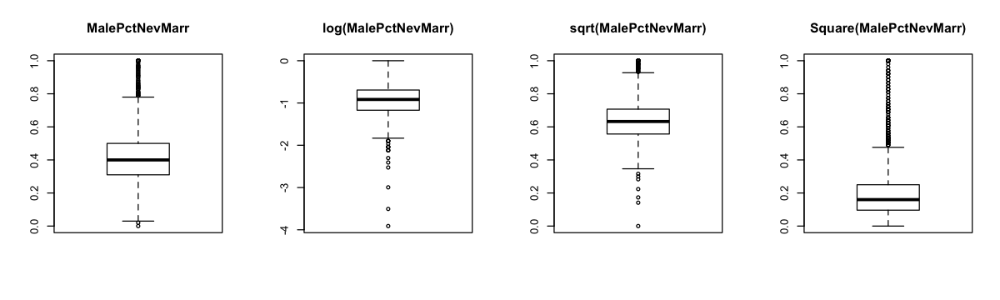

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

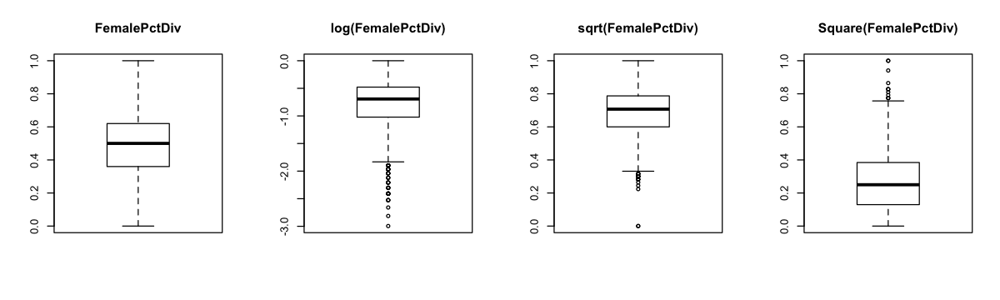

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

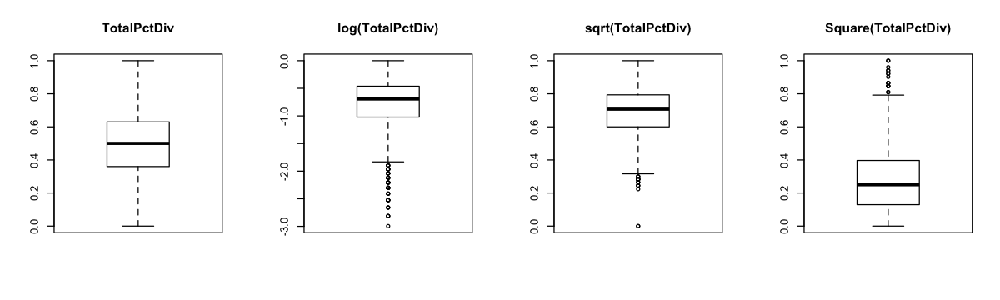

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

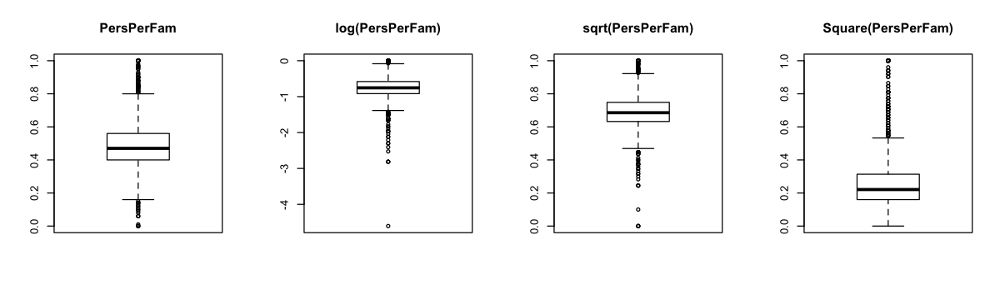

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

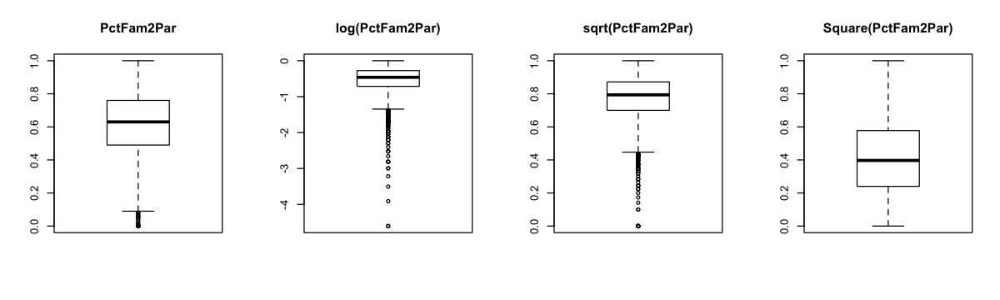

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

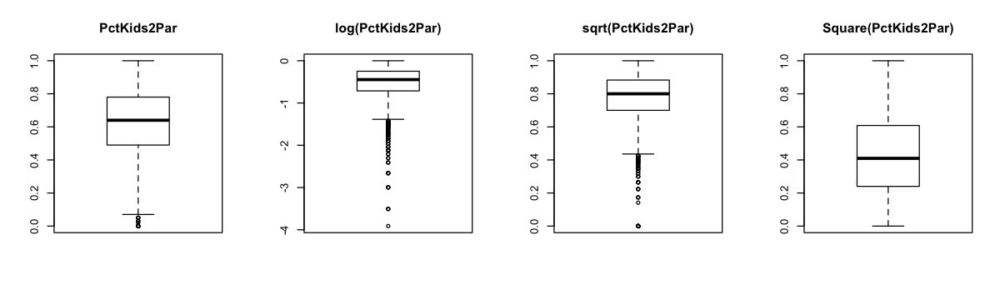

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

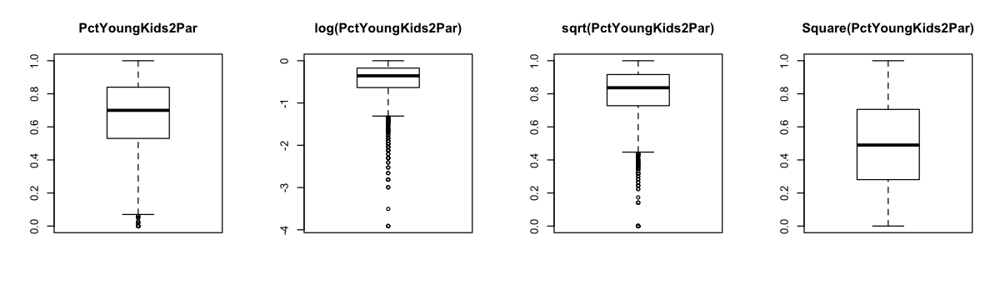

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

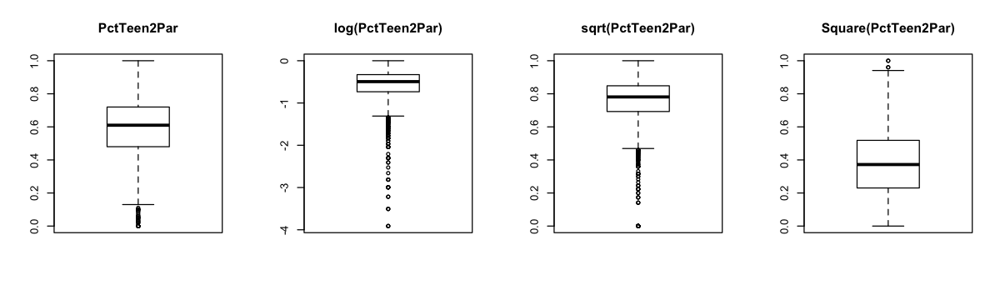

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

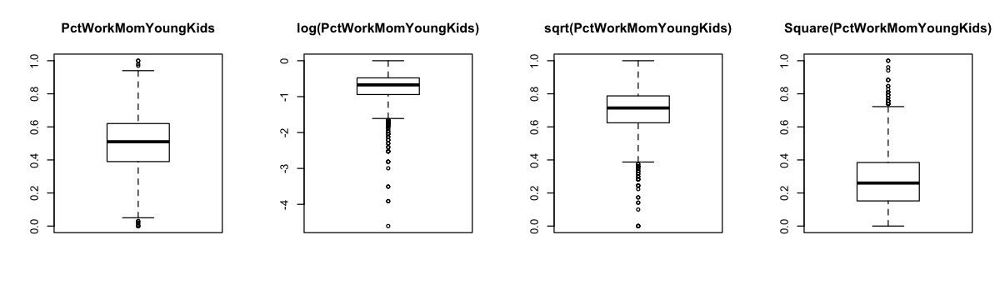

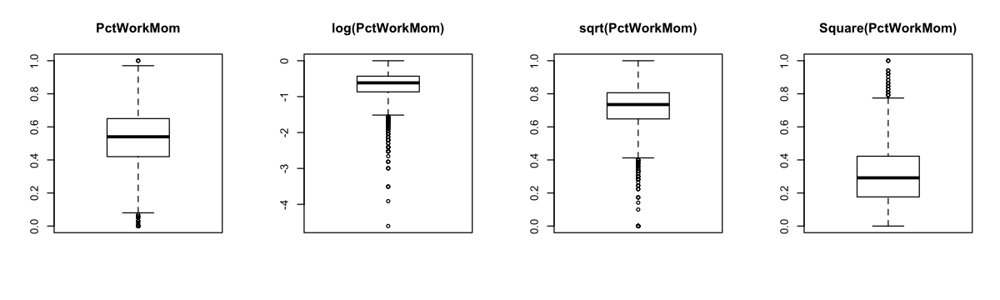

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

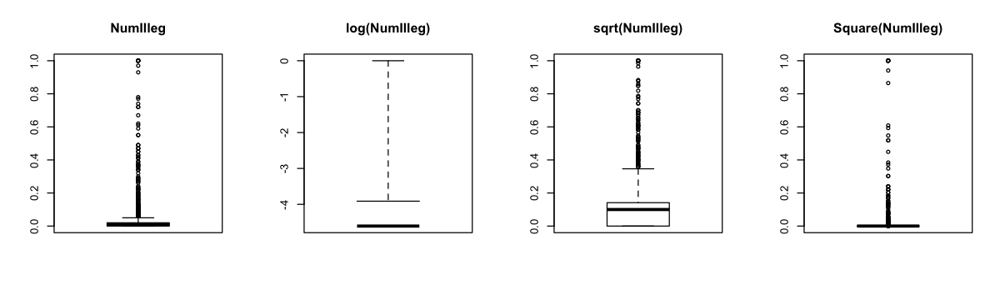

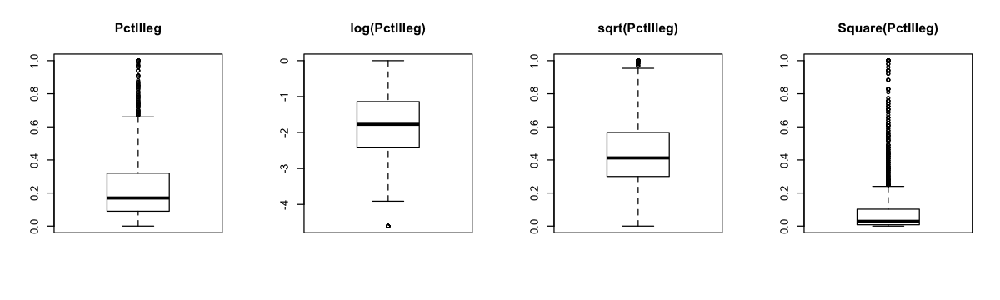

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

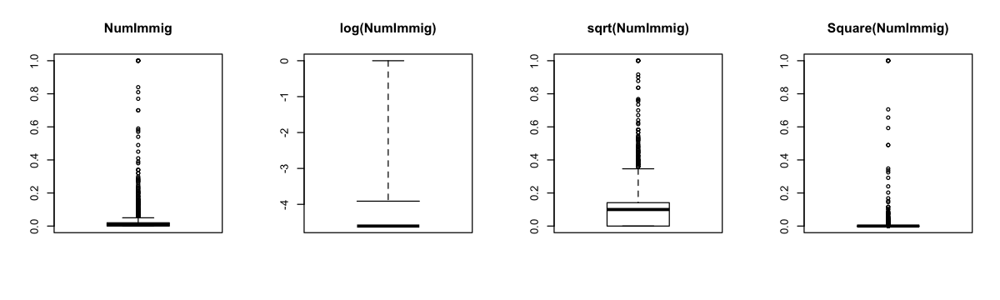

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

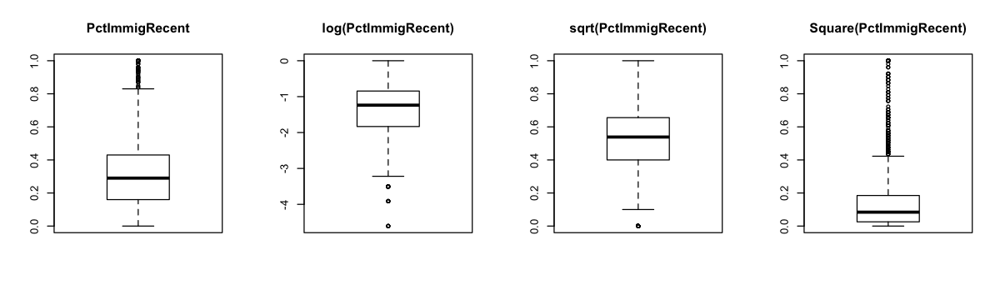

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

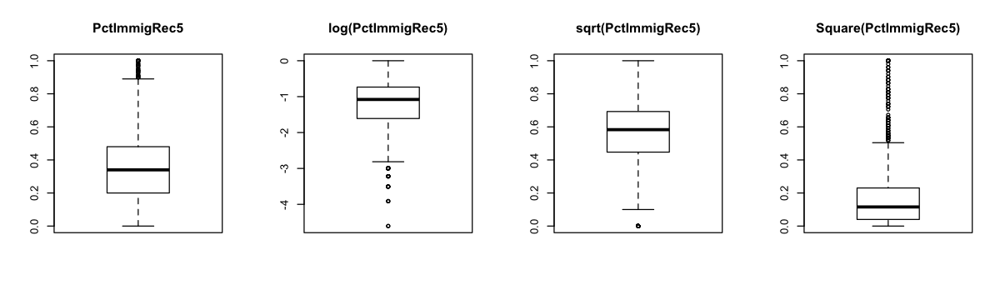

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

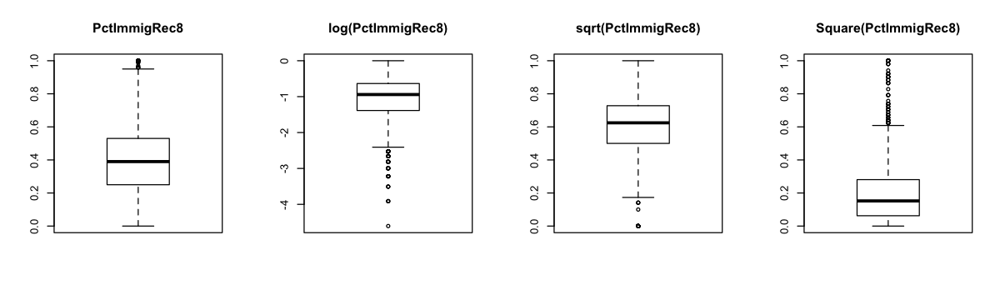

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

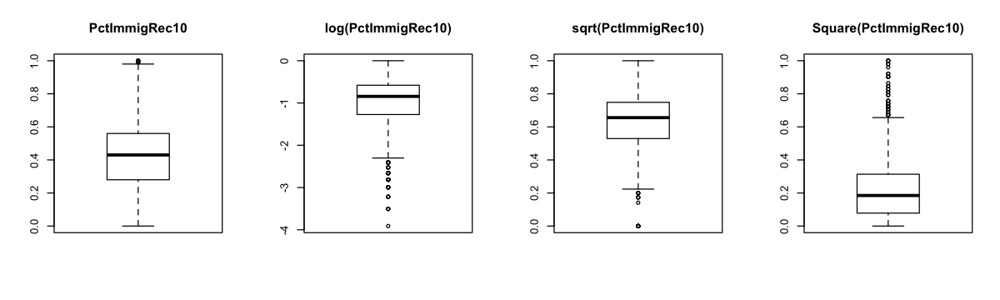

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

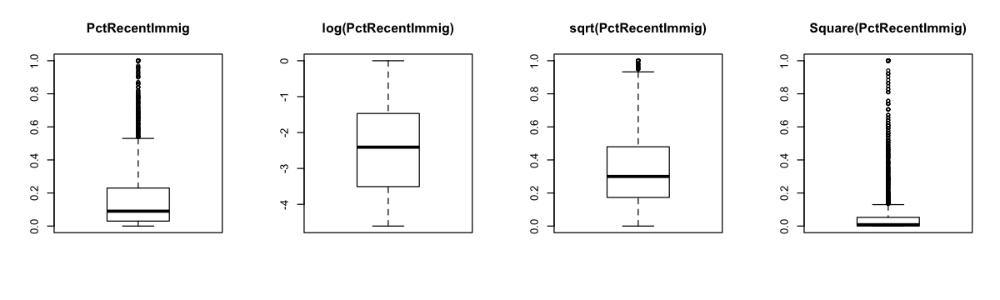

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

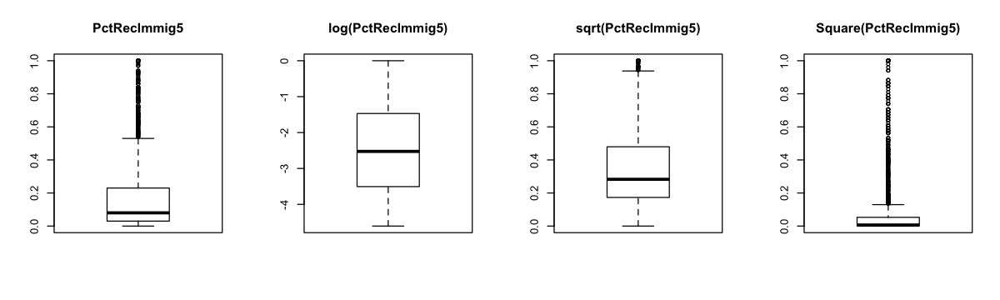

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

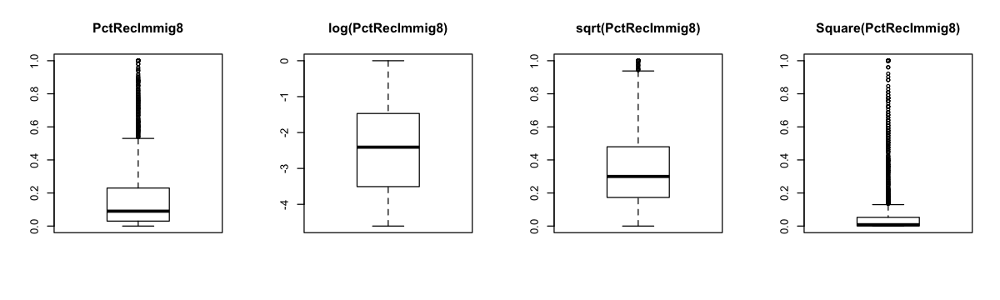

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

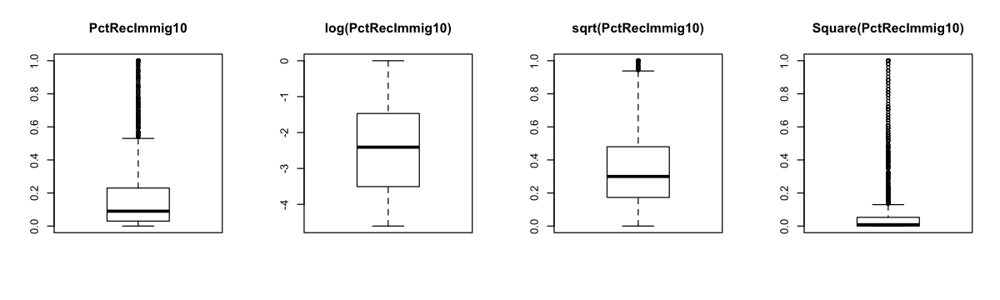

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

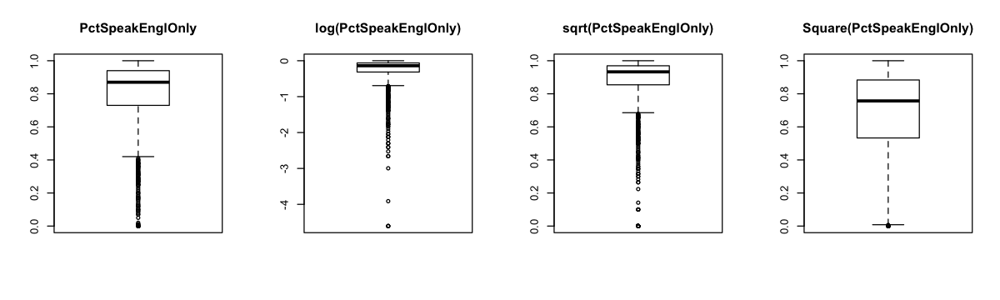

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

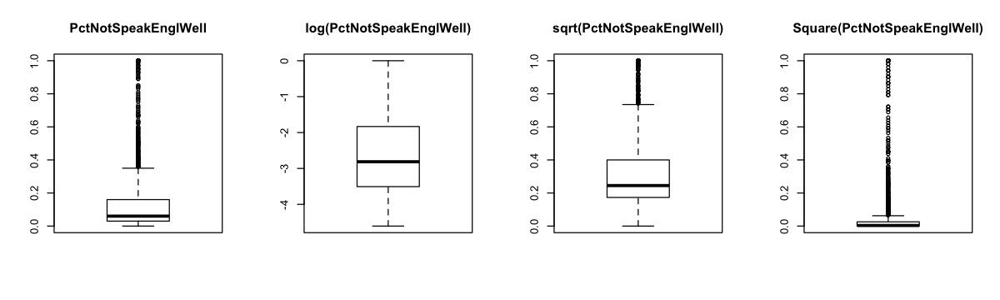

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

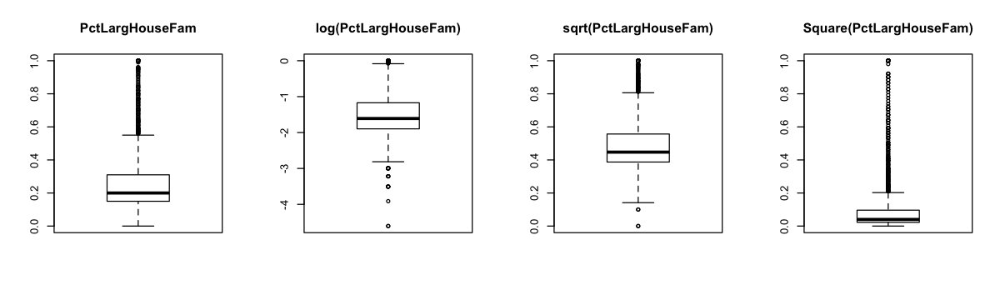

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

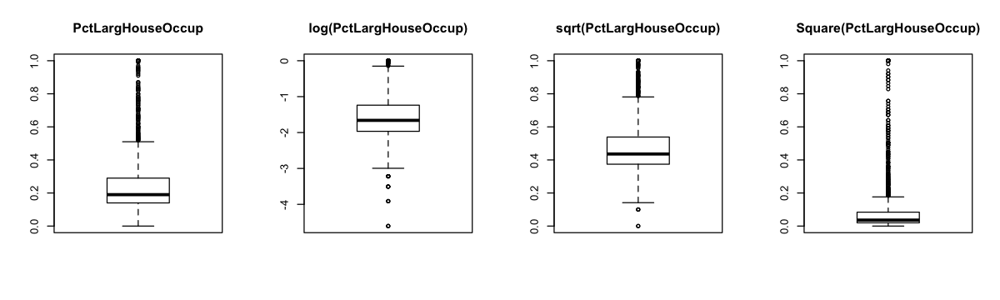

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

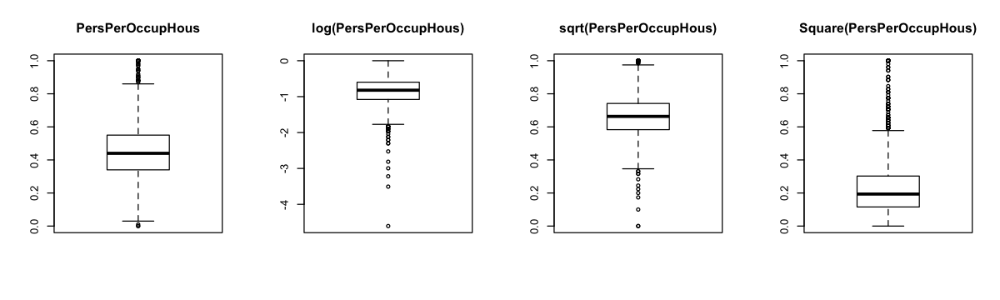

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

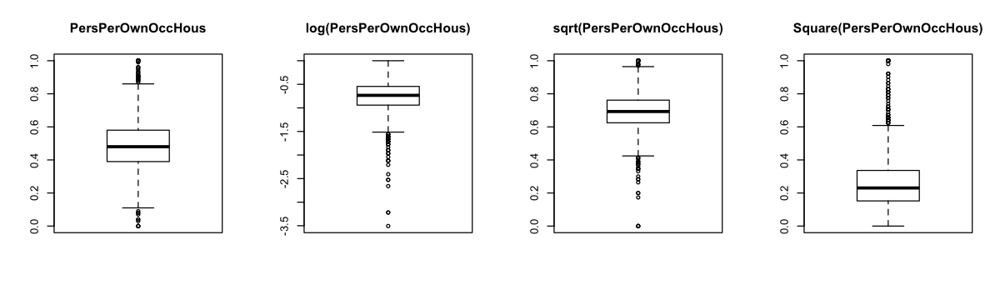

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

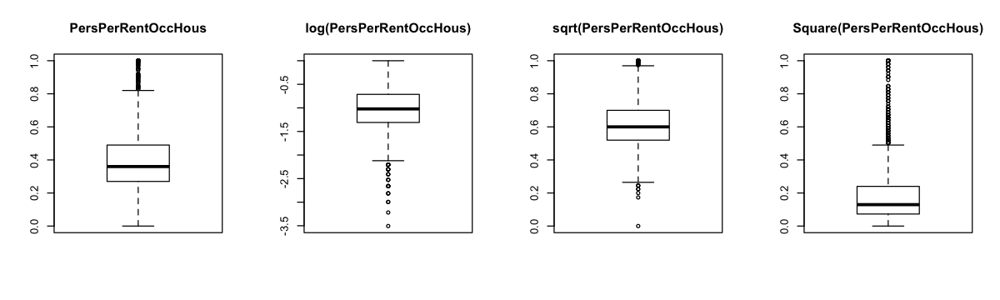

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

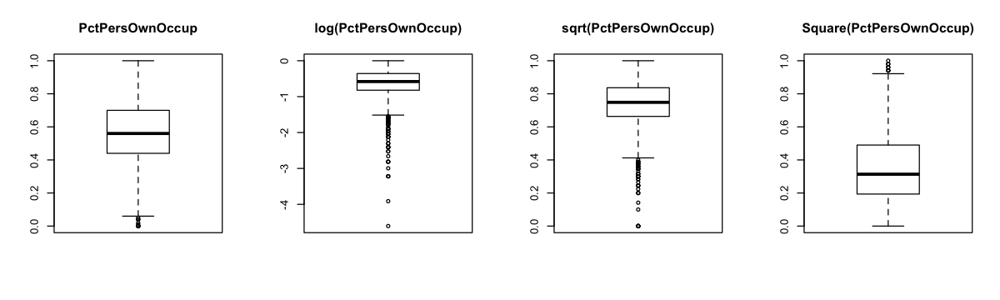

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

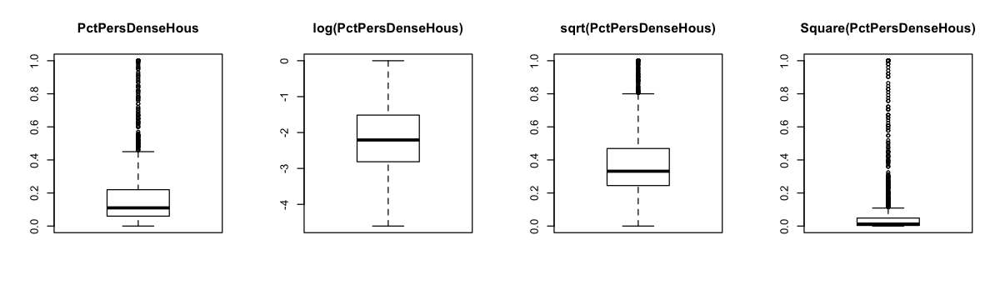

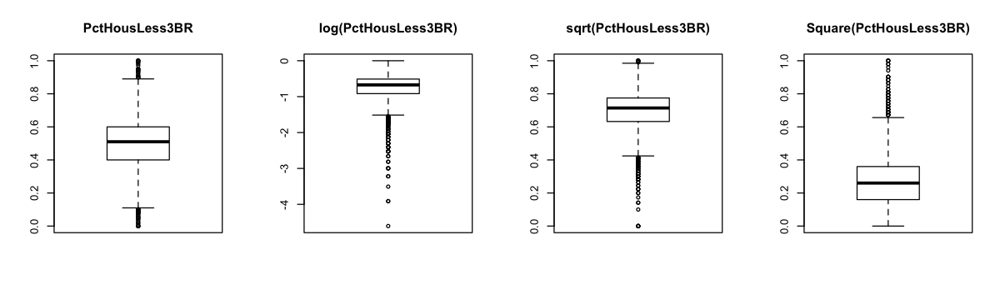

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

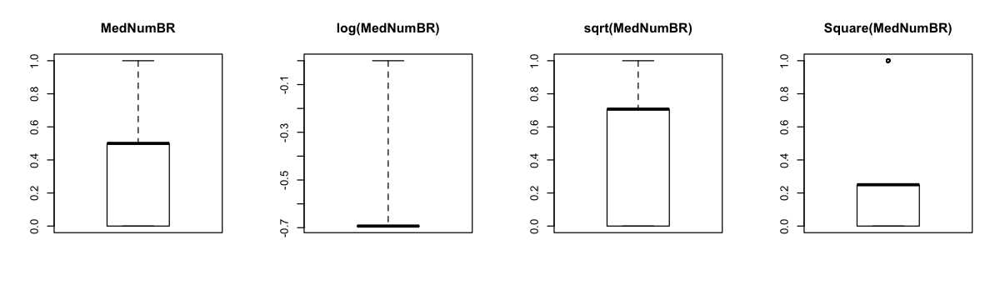

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

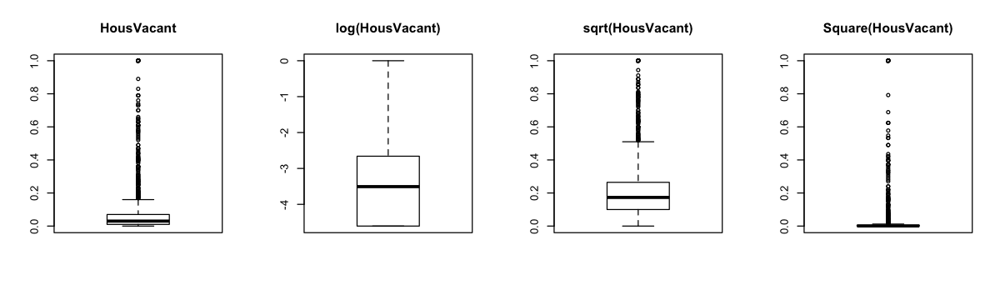

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

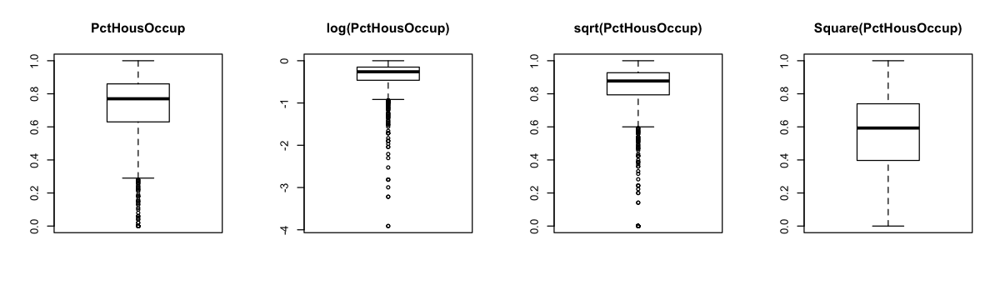

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

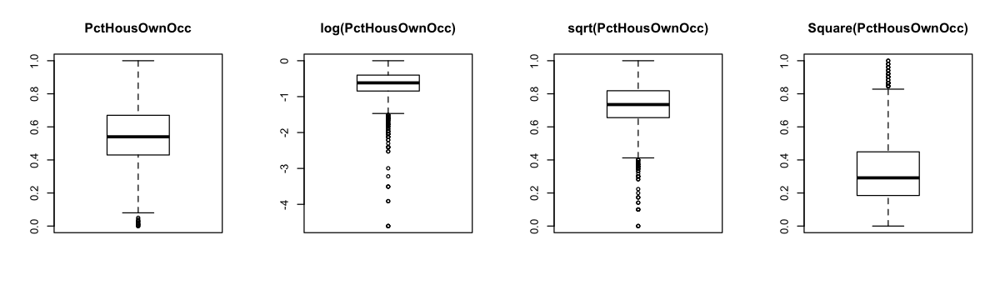

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

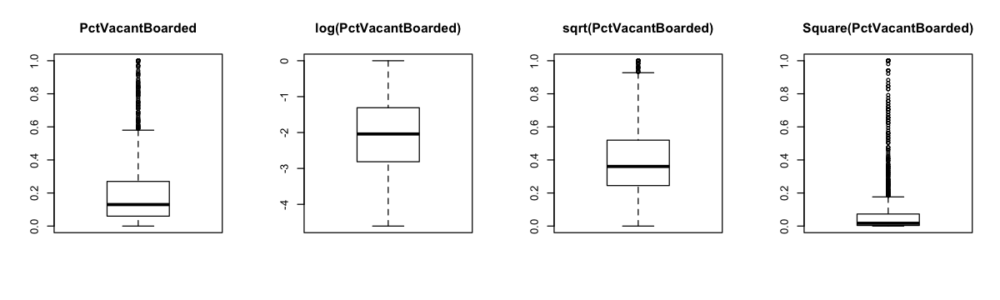

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

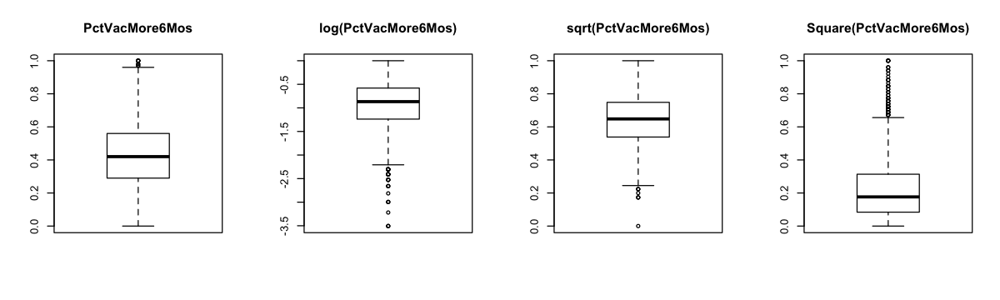

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

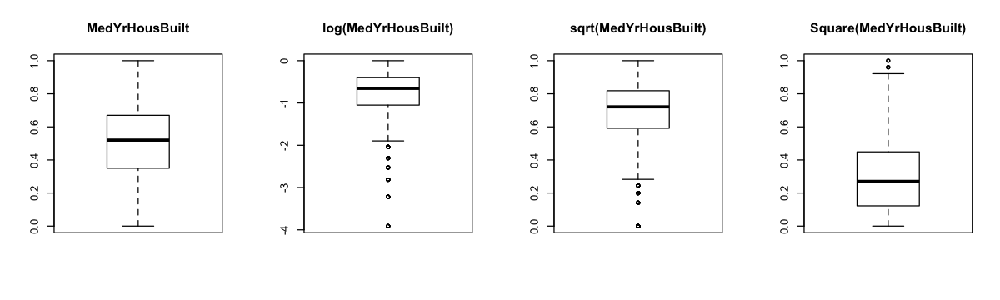

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

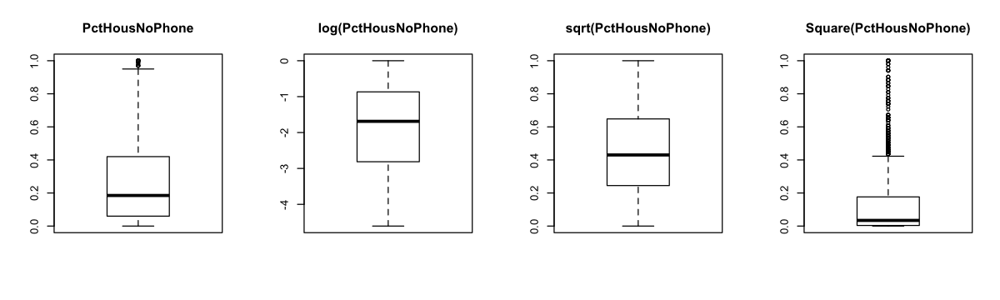

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

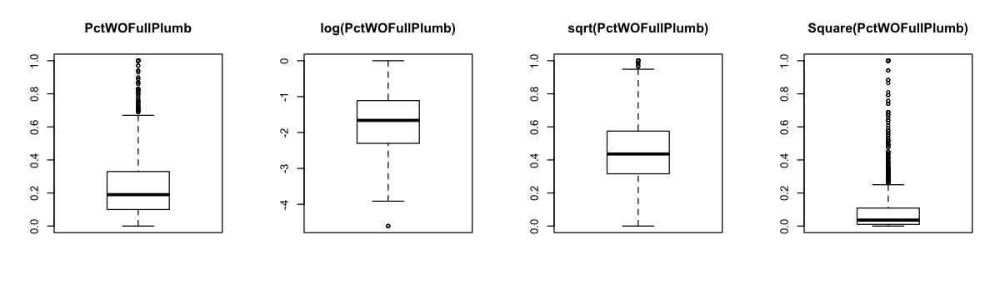

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

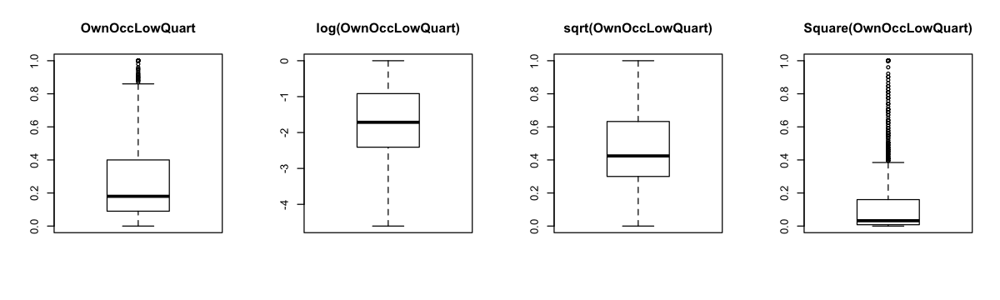

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

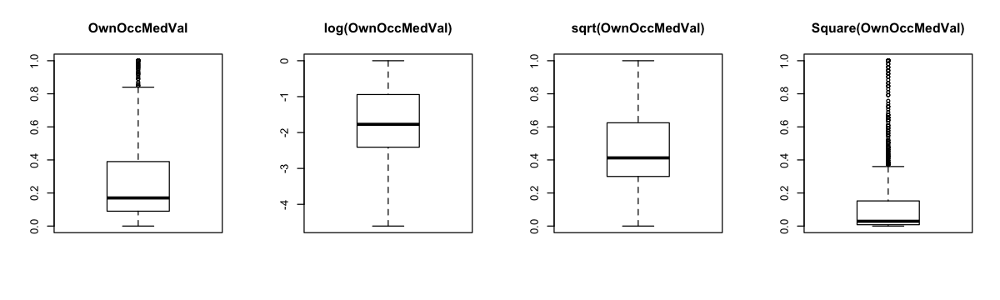

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

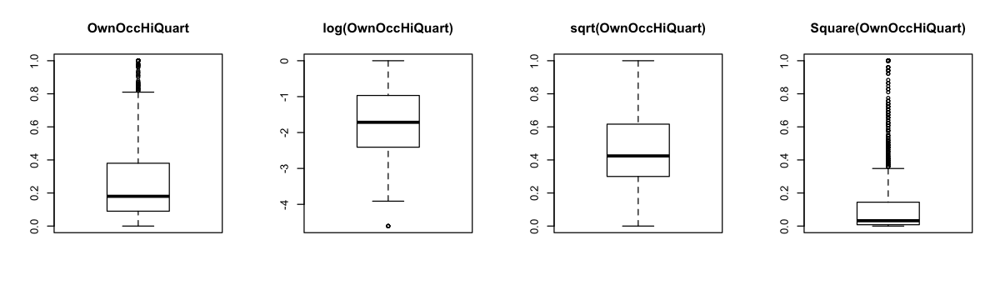

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

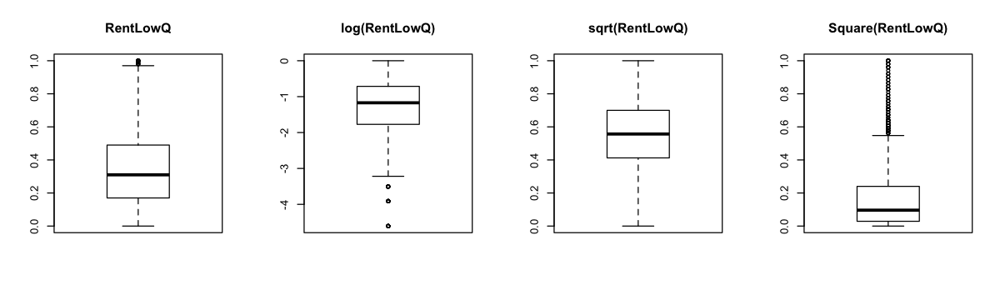

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

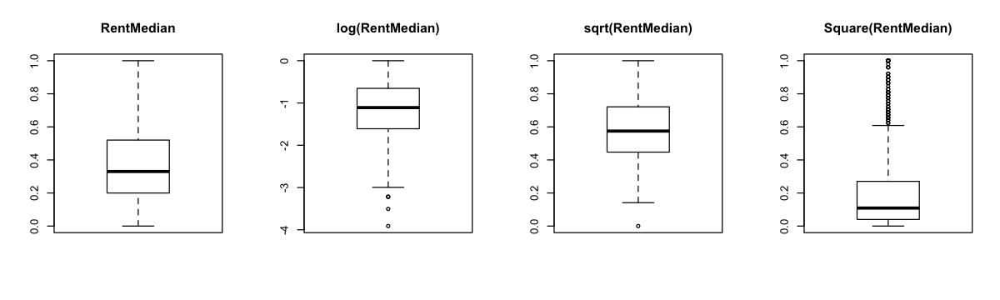

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

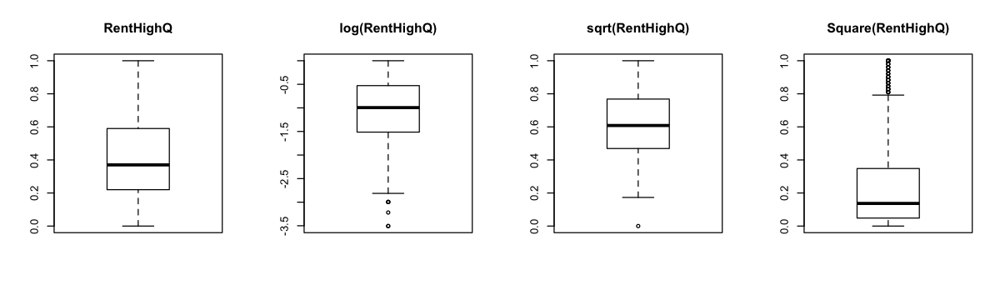

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

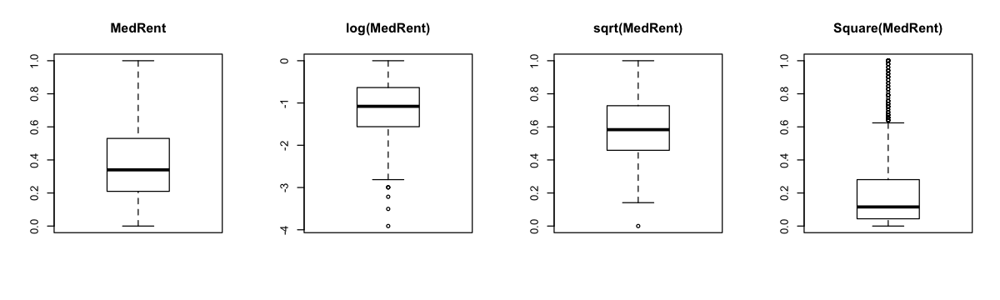

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

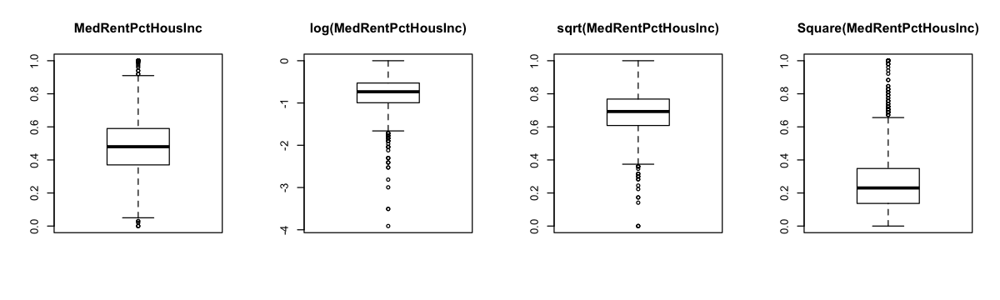

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

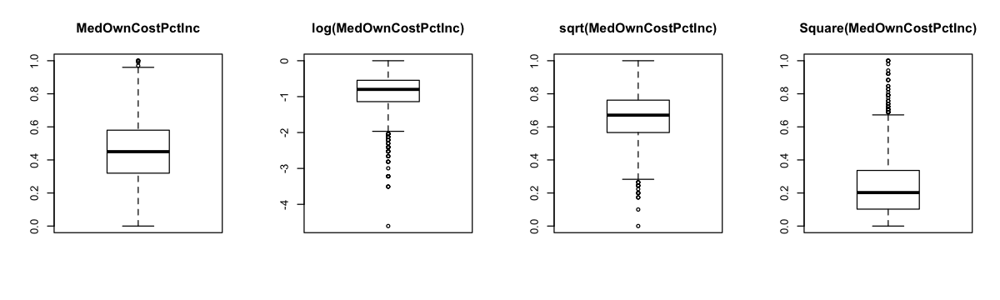

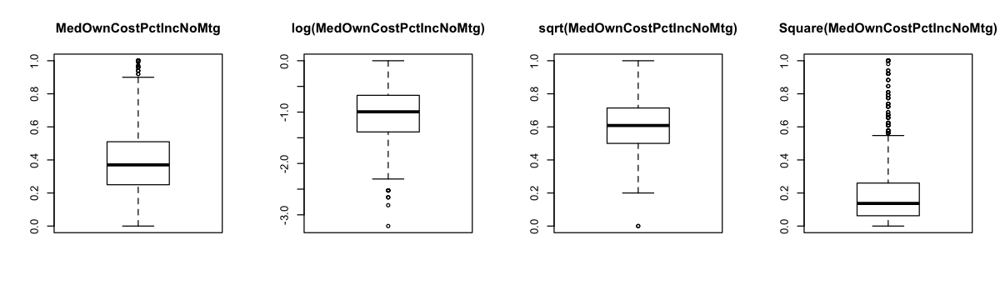

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

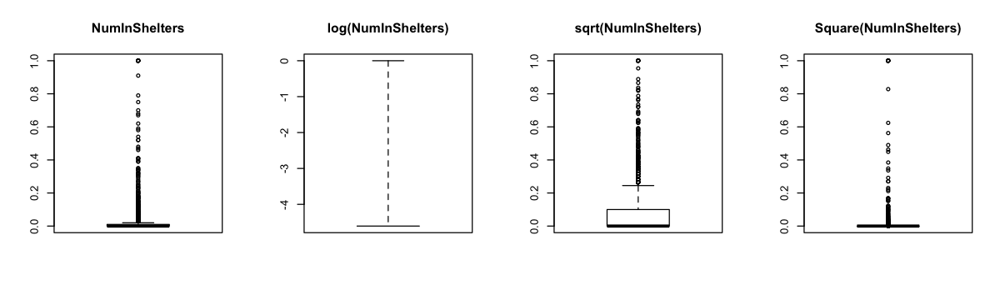

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

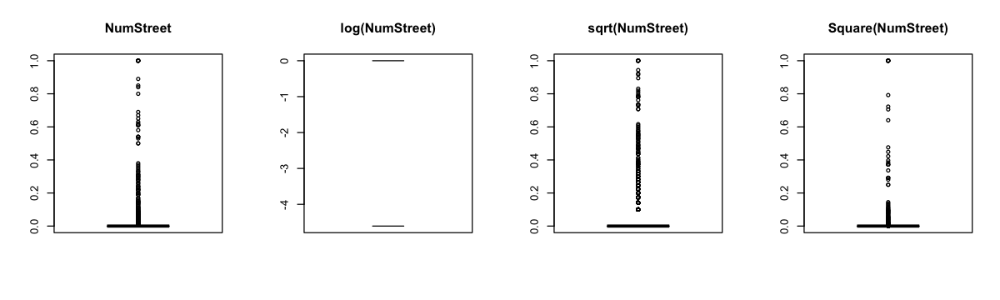

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

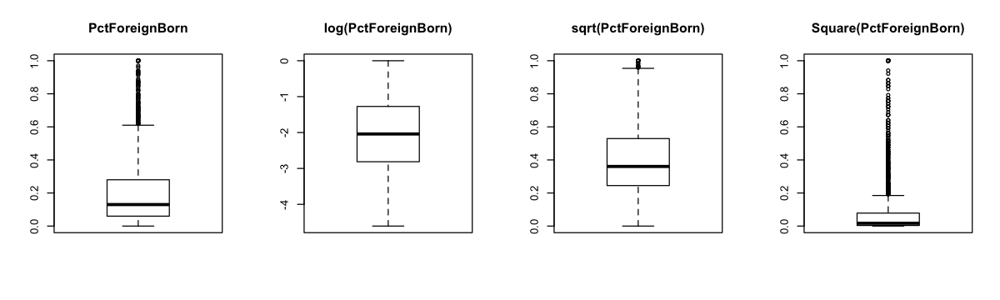

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

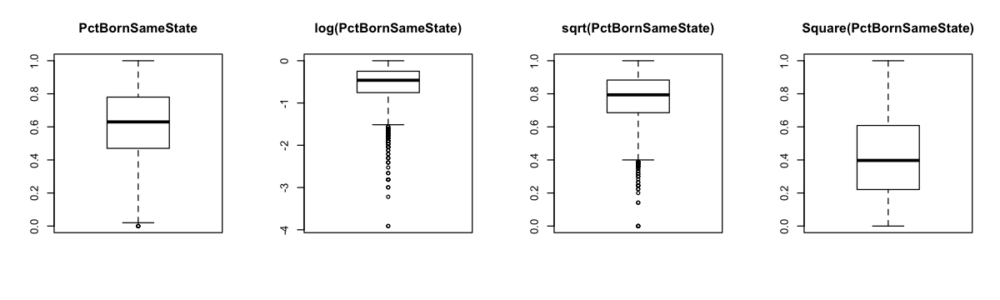

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

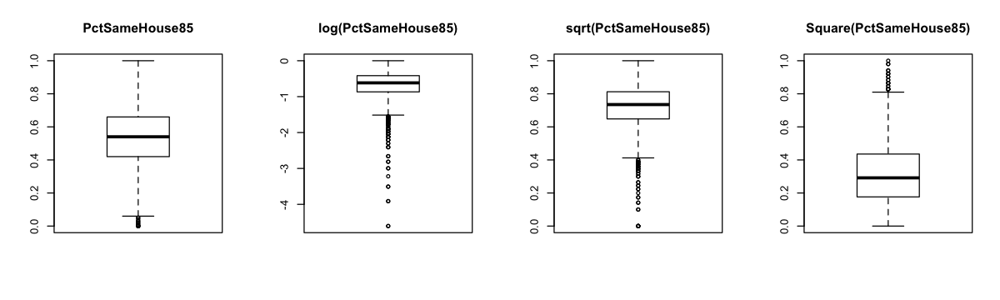

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

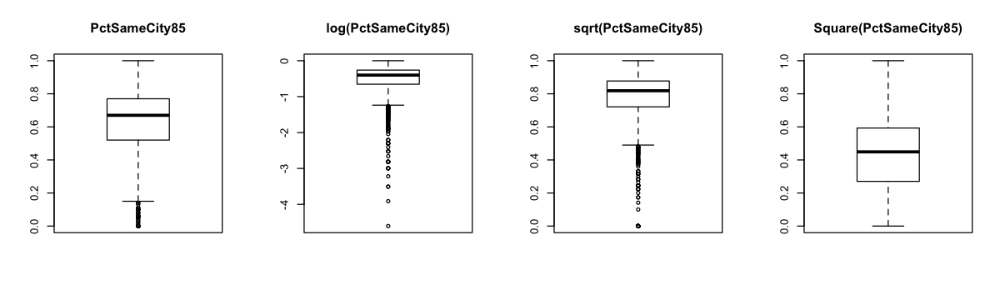

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

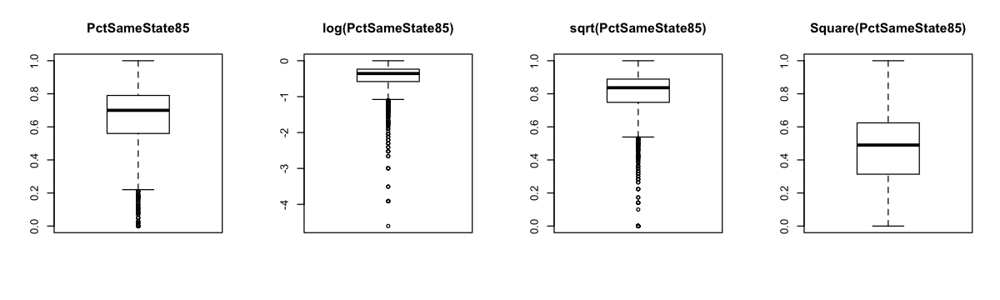

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

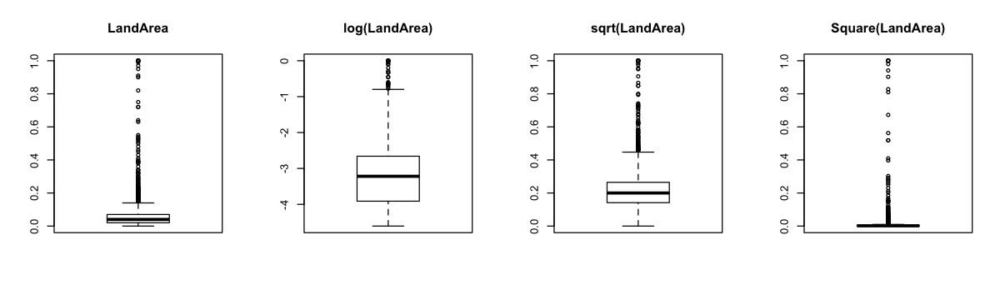

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

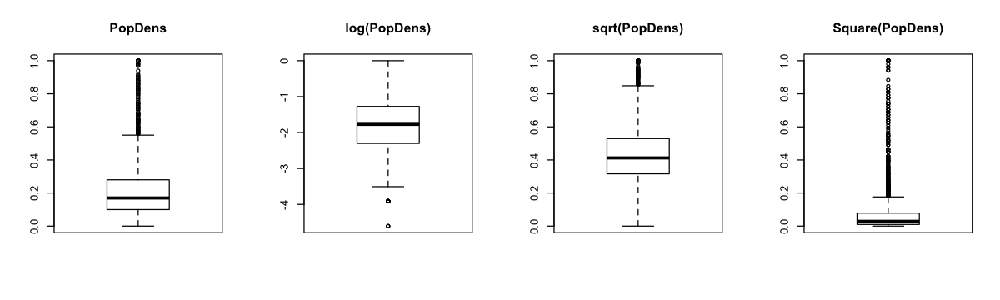

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

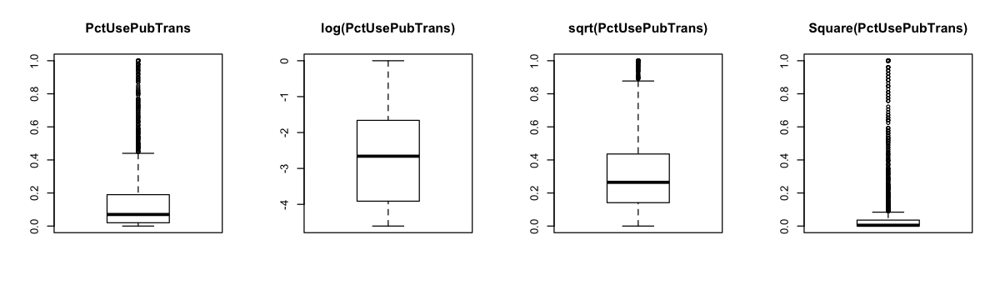

Warning message in bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == :
“Outlier (-Inf) in boxplot 1 is not drawn”

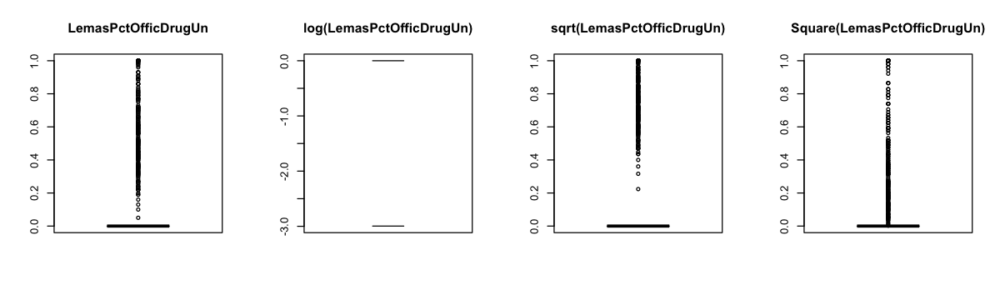

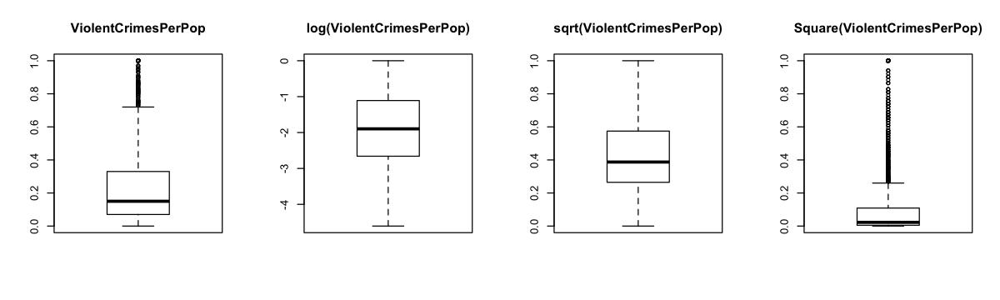

In [11]:
options(repr.plot.width=10, repr.plot.height=3)
n_col <- ncol(Ndata)
for (i in seq(1, ncol(Ndata))){
    par(mfrow=c(1, 4))
    nameStr = names(Ndata)[i]
    boxplot(Ndata[i], main=nameStr)
    nameStr = paste('log(',names(Ndata)[i],")", sep="")
    boxplot(log(Ndata[i]), main=nameStr)
    nameStr = paste('sqrt(',names(Ndata)[i],")", sep="")
    boxplot(sqrt(Ndata[i]), main=nameStr)
    nameStr = paste('Square(',names(Ndata)[i],")", sep="")
    boxplot(Ndata[i]^2, main=nameStr)
}

### Corelation matrix and Scatterplot matrix

From the scatter plot and correlation heatmap, we can see that some variables are strongly correlated with each others.

Also, we can see that some variable are strongly correlated with response variable.

In [12]:
cor_coef <- round(cor(Ndata),2)

From the below heatmap, we can see that there are many features which are highly corelated to each other.

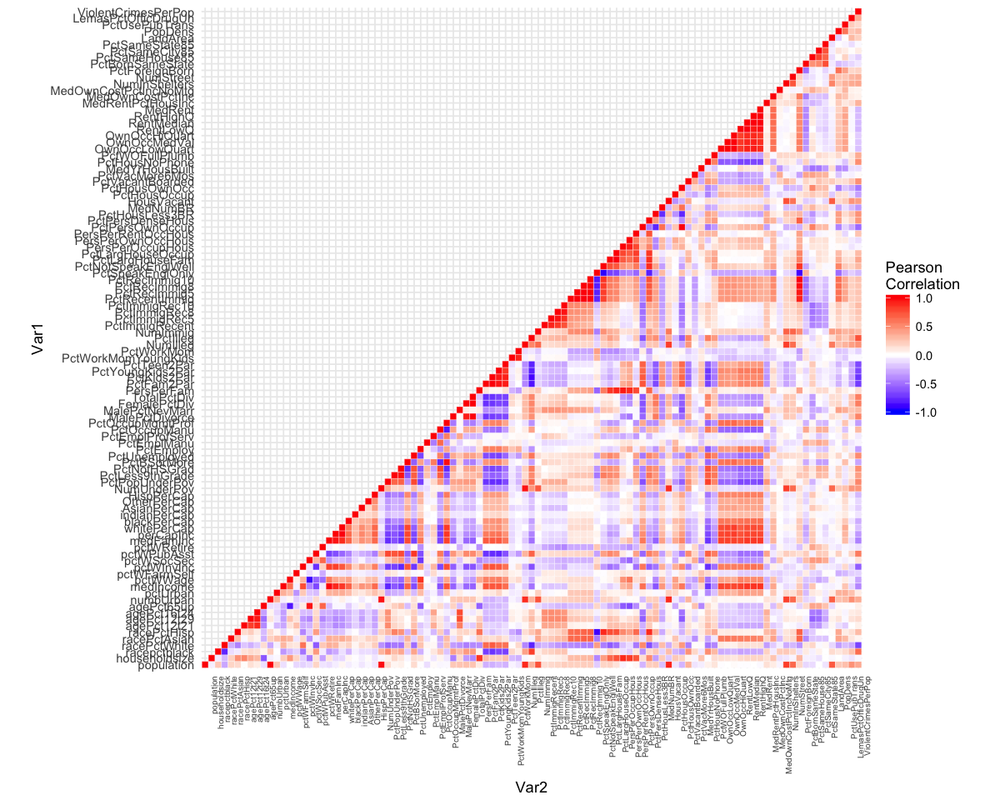

In [13]:
melted_cormat <- melt(cor_coef)
# Get lower triangle of the correlation matrix
get_lower_tri<-function(cor_coef){
    cor_coef[upper.tri(cor_coef)] <- NA
    return(cor_coef)
}
# Get upper triangle of the correlation matrix
get_upper_tri <- function(cor_coef){
    cor_coef[lower.tri(cor_coef)]<- NA
    return(cor_coef)
}
upper_tri <- get_upper_tri(cor_coef)

# Melt the correlation matrix
options(repr.plot.width=10, repr.plot.height=8)
melted_cormat <- melt(upper_tri, na.rm = TRUE)
# Heatmap
ggplot(data = melted_cormat, aes(Var2, Var1, fill = value))+
 geom_tile(color = "white")+
 scale_fill_gradient2(low = "blue", high = "red", mid = "white", 
   midpoint = 0, limit = c(-1,1), space = "Lab", 
   name="Pearson\nCorrelation") +
  theme_minimal()+ 
 theme(axis.text.x = element_text(angle = 90, vjust = 2, 
    size = 6, hjust = 1))+
 coord_fixed()

From the below scatterplot matrix, we can see that some features are strongly correlated with response variable.

null device 
          1

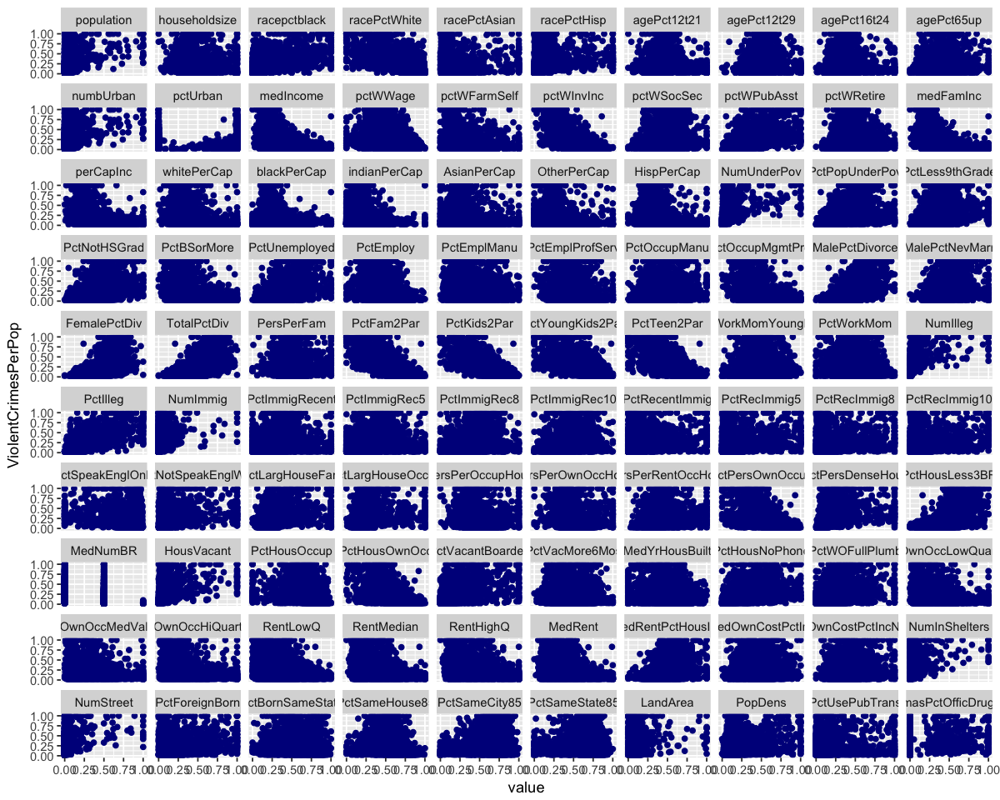

In [14]:
options(repr.plot.width=10, repr.plot.height=8)
m.Ndata = melt(Ndata, id="ViolentCrimesPerPop", na.rm = TRUE)
#png("file5.png", width = 600,height = 1100)
ggplot(m.Ndata, aes(value,ViolentCrimesPerPop)) + facet_wrap(~ variable) + geom_point(color='darkblue') 
dev.off()

Following 7 features out of 100 featurs are strongly correlated with target variable i.e. ViolentCrimesPerPop 

In [15]:
highly_corelated_w_response <- which(abs(cor_coef[,ncol(Ndata)])>=0.6)
for (i in names(highly_corelated_w_response)){
    print(i)
}

[1] "racepctblack"
[1] "racePctWhite"
[1] "PctFam2Par"
[1] "PctKids2Par"
[1] "PctYoungKids2Par"
[1] "PctTeen2Par"
[1] "PctIlleg"
[1] "ViolentCrimesPerPop"


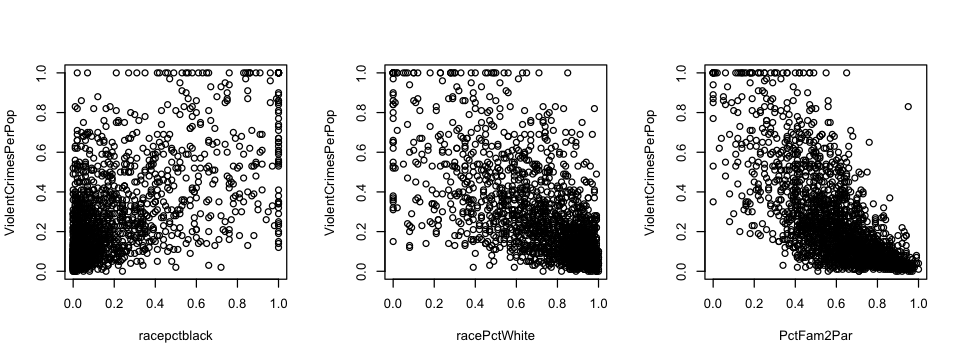

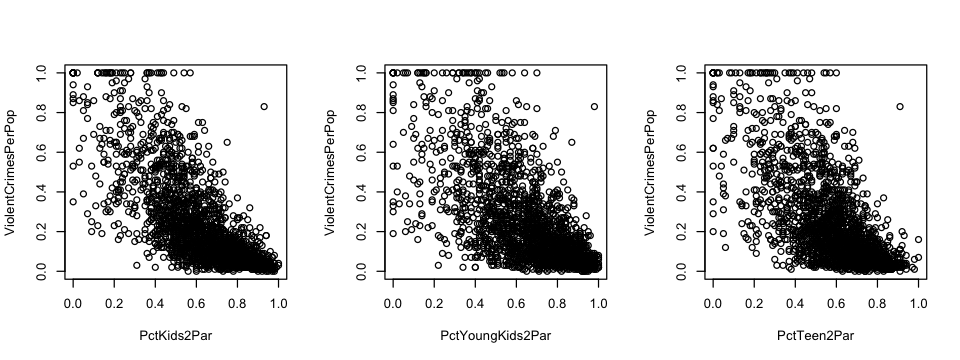

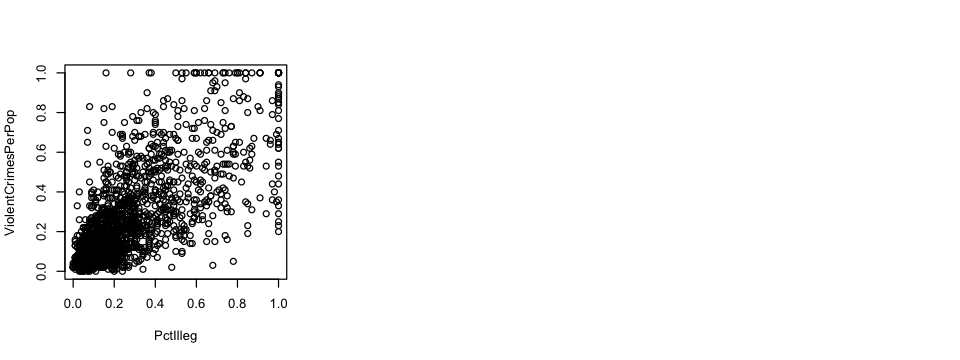

In [16]:
options(repr.plot.width=8, repr.plot.height=3)
par(mfrow=c(1, 3))
for (i in names(highly_corelated_w_response)){
    if (i != "ViolentCrimesPerPop"){
        plot(Ndata[,i],Ndata$ViolentCrimesPerPop,xlab = i, ylab = "ViolentCrimesPerPop")
    }
}

Now let's check whether fetaures are correlated with each other or not. Creating a new dataframe after removing target variable.

From the below heat map, we can clearly see that many features are correlated with each other.

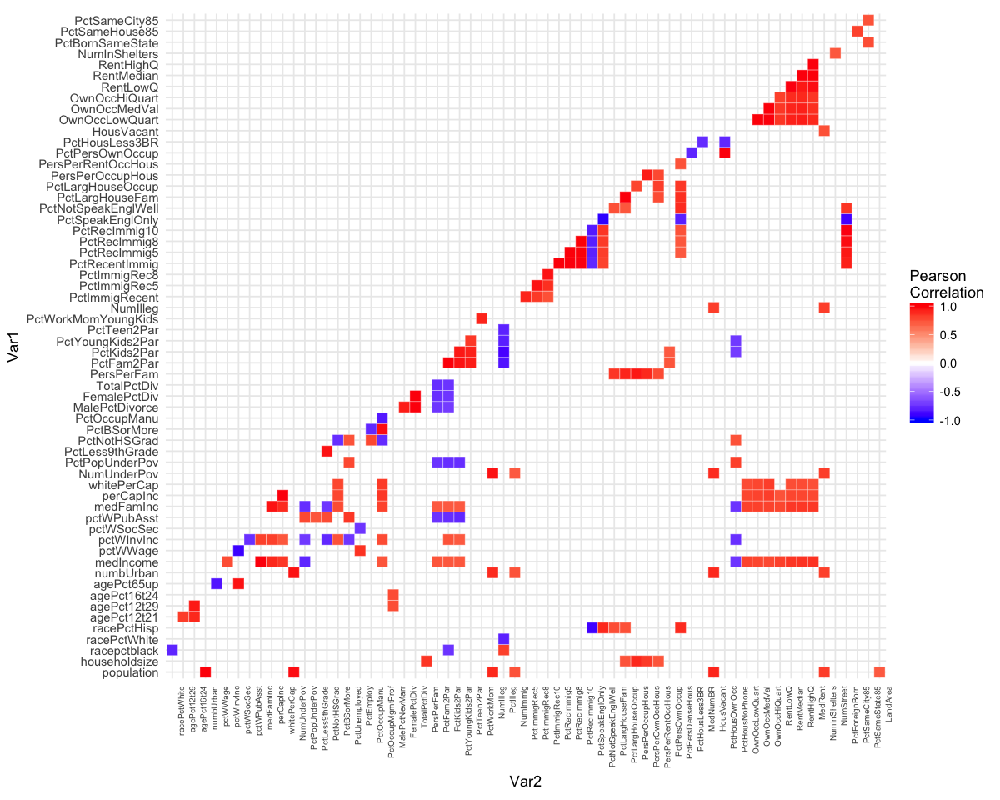

In [17]:
NData1 <- Ndata[,-c(101)]
cor_coef1 <- round(cor(NData1),2)
for (i in 1:nrow(cor_coef1)){
    for (j in 1:ncol(cor_coef1)){
        if(abs(cor_coef1[i,j]) <= 0.7){
            cor_coef1[i,j] <- NA
        }
        if(i==j){
            cor_coef1[i,j] <- NA
        }
    }
}
upper_tri <- get_upper_tri(cor_coef1)

options(repr.plot.width=10, repr.plot.height=8)

melted_cormat <- melt(upper_tri, na.rm = TRUE)
# Heatmap
ggplot(data = melted_cormat, aes(Var2, Var1, fill = value))+
 geom_tile(color = "white")+
 scale_fill_gradient2(low = "blue", high = "red", mid = "white", 
   midpoint = 0, limit = c(-1,1), space = "Lab", 
   name="Pearson\nCorrelation") +
  theme_minimal()+ 
 theme(axis.text.x = element_text(angle = 90, vjust = 2, 
    size = 6, hjust = 1))+
 coord_fixed()

Following features are strongly correlated with each other.

In [18]:
print(melted_cormat[order(abs(melted_cormat$value),decreasing = TRUE),])

                    Var1                Var2 value
5959        PctRecImmig8       PctRecImmig10  1.00
1001          population           numbUrban  0.99
4444          PctFam2Par         PctKids2Par  0.99
5757      PctRecentImmig        PctRecImmig5  0.99
5858        PctRecImmig5        PctRecImmig8  0.99
5958        PctRecImmig5       PctRecImmig10  0.99
8080      OwnOccLowQuart        OwnOccMedVal  0.99
8181        OwnOccMedVal       OwnOccHiQuart  0.99
8584          RentMedian             MedRent  0.99
1913           medIncome           medFamInc  0.98
4139      MalePctDivorce         TotalPctDiv  0.98
4141        FemalePctDiv         TotalPctDiv  0.98
5857      PctRecentImmig        PctRecImmig8  0.98
6363     PctLargHouseFam   PctLargHouseOccup  0.98
7368     PctPersOwnOccup       PctHousOwnOcc  0.98
8180      OwnOccLowQuart       OwnOccHiQuart  0.98
8484          RentMedian           RentHighQ  0.98
8585           RentHighQ             MedRent  0.98
2121           perCapInc       

There is perfect linear relationship between PctRecImmig8 and PctRecImmig10.

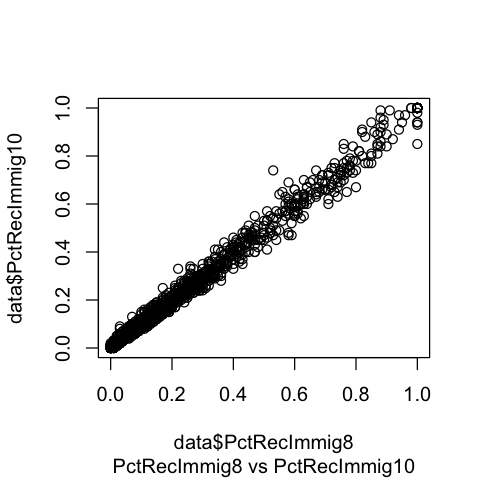

In [19]:
options(repr.plot.width=4, repr.plot.height=4)
plot(data$PctRecImmig8, data$PctRecImmig10,sub = "PctRecImmig8 vs PctRecImmig10")

### Model Building

#### Splitted data into Training and Validation data

In [20]:
set.seed(100)  # setting seed to reproduce results of random sampling
train.index <- createDataPartition(Ndata$ViolentCrimesPerPop, p=0.8, list=FALSE)
trainingData <- Ndata[unlist(train.index),]
validationData <- Ndata[-unlist(train.index),]

#### Clustering

Let's check is there any clusers present in the data. From the below dendrogram, we can see that there are no clusers present in the data. 

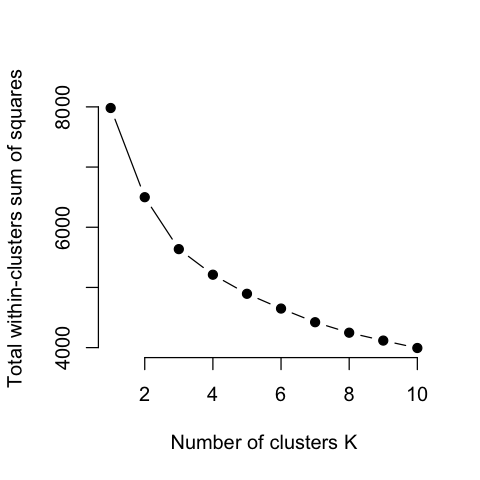

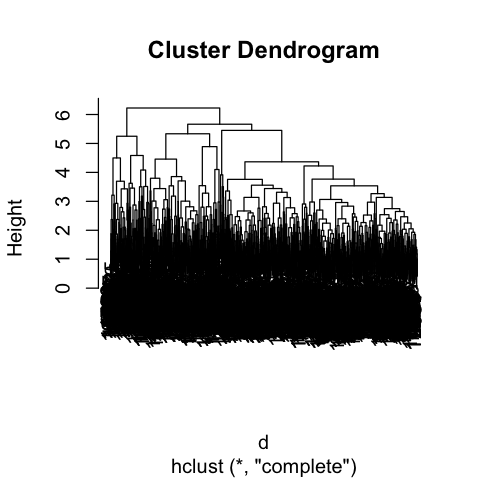

In [21]:
Clustering_dummy <- function(data,k.max = 15){
  wss <- sapply(1:k.max, 
                function(k){kmeans(data, k, nstart=50,iter.max = 15 )$tot.withinss})
  wss
  plot(1:k.max, wss,
       type="b", pch = 19, frame = FALSE, 
       xlab="Number of clusters K",
       ylab="Total within-clusters sum of squares")
  
  d <- dist(as.matrix(data)) 
  hc <- hclust(d) 
  plot(hc)
}

Data_Clust<-Ndata[,-ncol(Ndata)]## Knocking off the Response variable
Clustering_dummy(Data_Clust, 10)

##### Model 1

Build a first model with all independent variables. From the summary of the model, we can see many independent variables are not significant. This model explained 70% variations. (R Squared is 70%.)

In [22]:
model1 = lm('ViolentCrimesPerPop ~ .', data=trainingData)

summary(model1)


Call:
lm(formula = "ViolentCrimesPerPop ~ .", data = trainingData)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.49042 -0.07073 -0.01417  0.05630  0.61931 

Coefficients:
                       Estimate Std. Error t value Pr(>|t|)    
(Intercept)            0.515262   0.238447   2.161 0.030861 *  
population            -0.312622   0.445227  -0.702 0.482687    
householdsize          0.023112   0.104867   0.220 0.825597    
racepctblack           0.218932   0.056230   3.893 0.000103 ***
racePctWhite          -0.024079   0.066003  -0.365 0.715304    
racePctAsian          -0.014007   0.038285  -0.366 0.714516    
racePctHisp            0.061095   0.060414   1.011 0.312047    
agePct12t21           -0.007610   0.118966  -0.064 0.949002    
agePct12t29           -0.200291   0.178086  -1.125 0.260901    
agePct16t24           -0.037590   0.185015  -0.203 0.839028    
agePct65up             0.150793   0.121898   1.237 0.216264    
numbUrban              0.181039   0.437767   

We can see from below QQ plot and residual distribution plot that Residual are normally distributed.

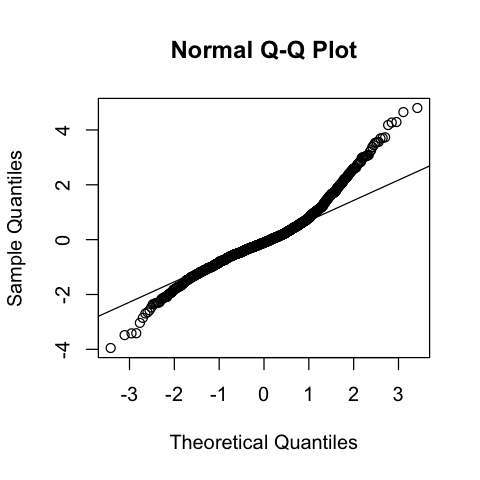

In [23]:
#QQ-plot of the residuals
qqnorm(rstandard(model1))
qqline(rstandard(model1))

As there are many insignificant variables in this model, we need to understand why these variables are not significant. <br>
We need to check following:<br><br>
Is there any multi colinearity present? <br/>
Do we need to transform the data before modeling?

As we already seen above, many independent variables are strongly correlated with each other.

From the residual plot, we can clearly see that there seems a trend. Clearly, something is wrong with our first model.

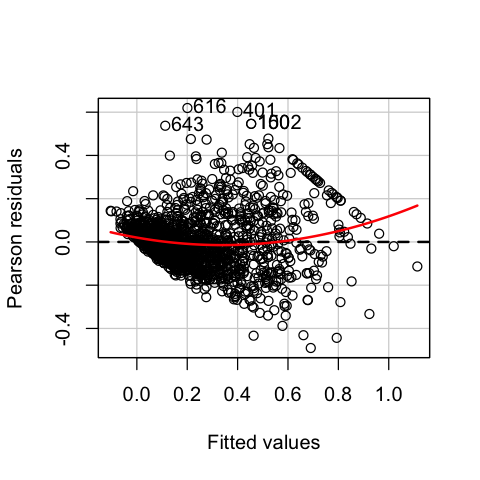

In [24]:
residualPlot(model1, id.n=5)

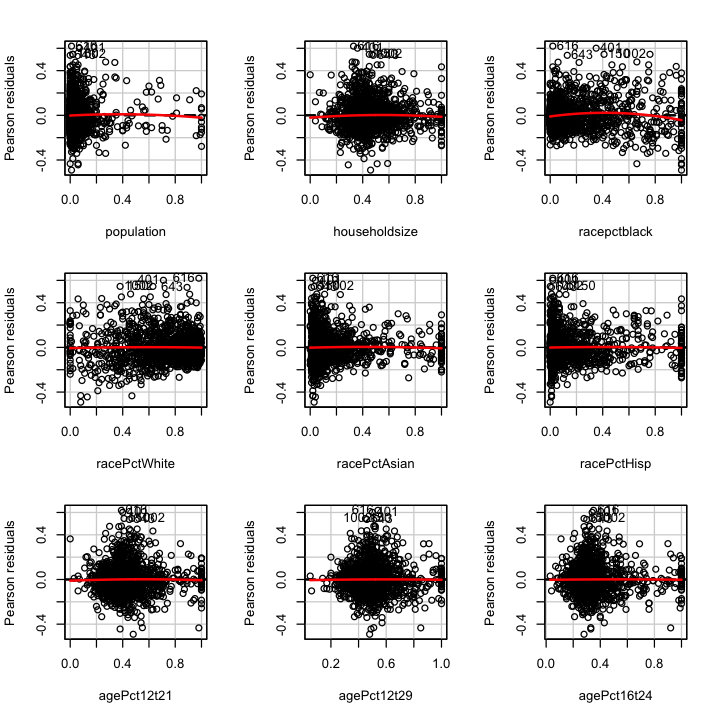

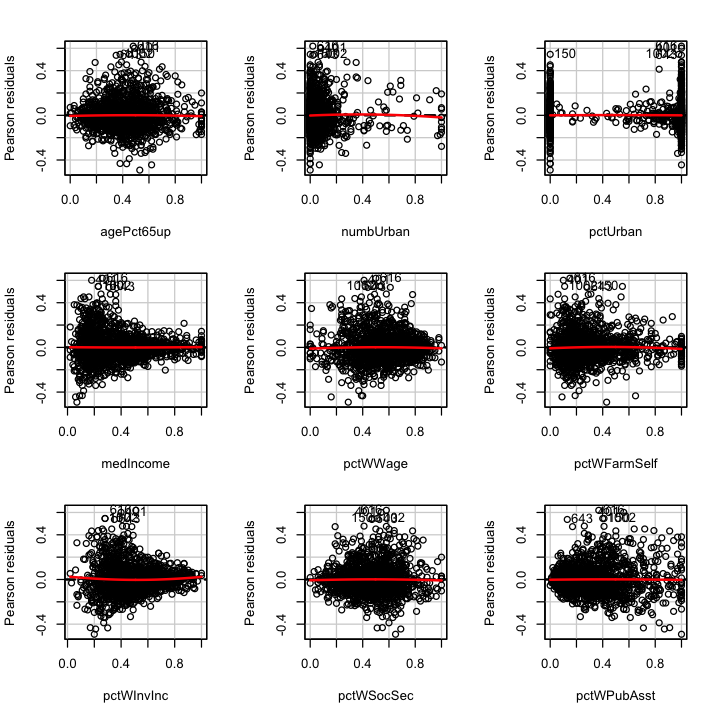

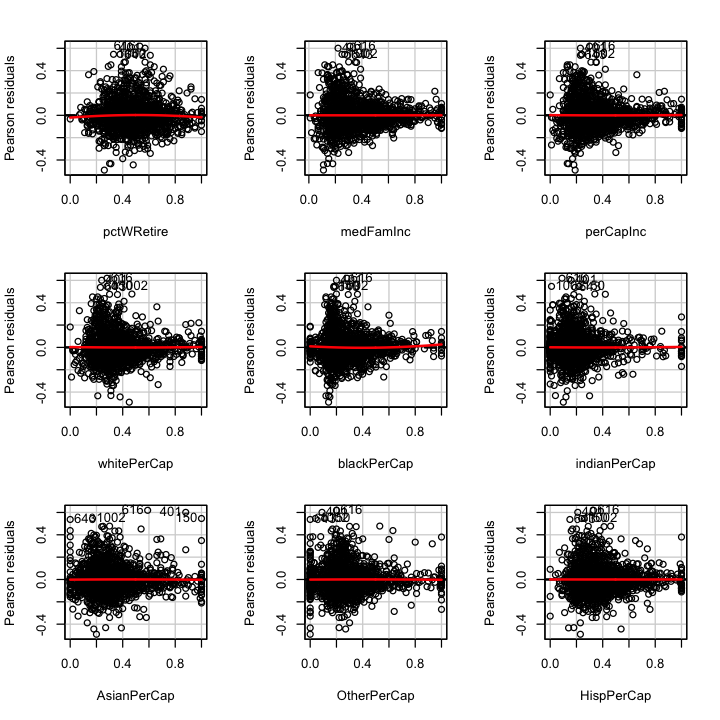

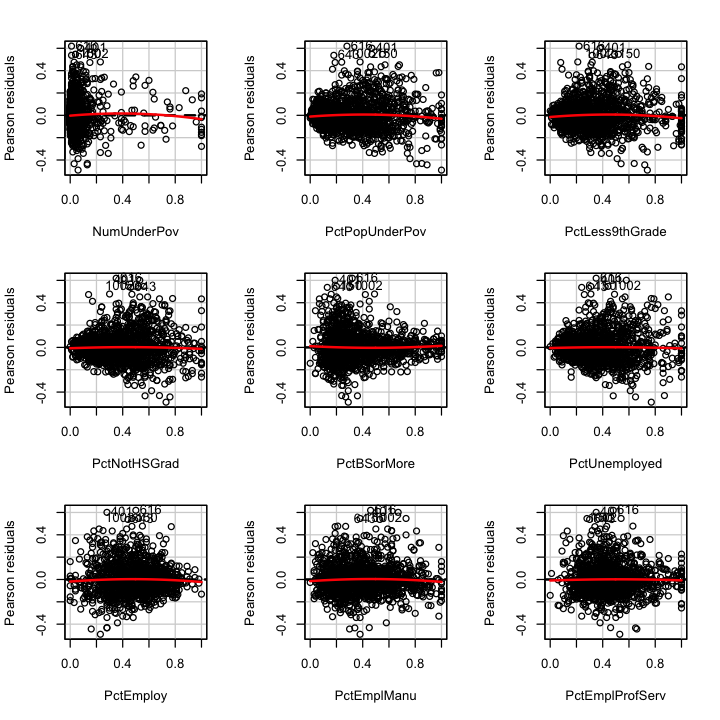

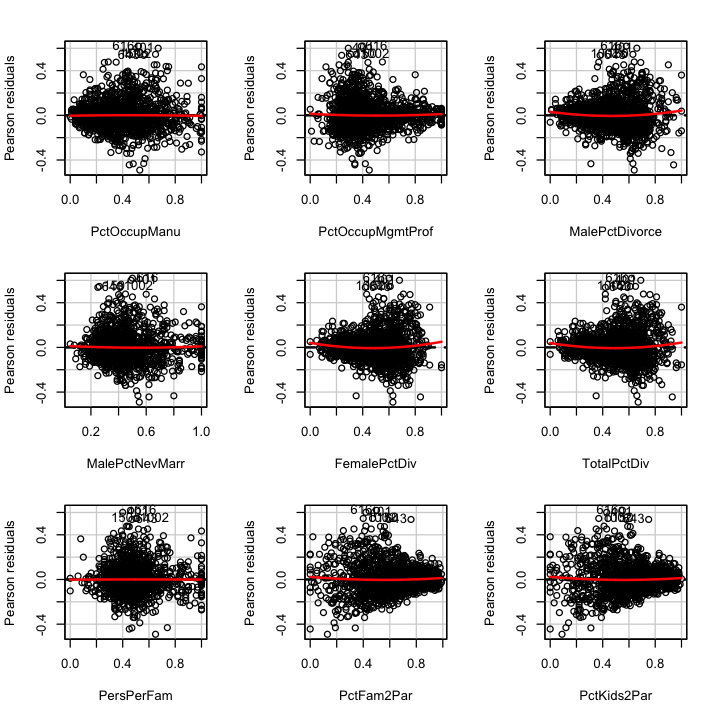

...

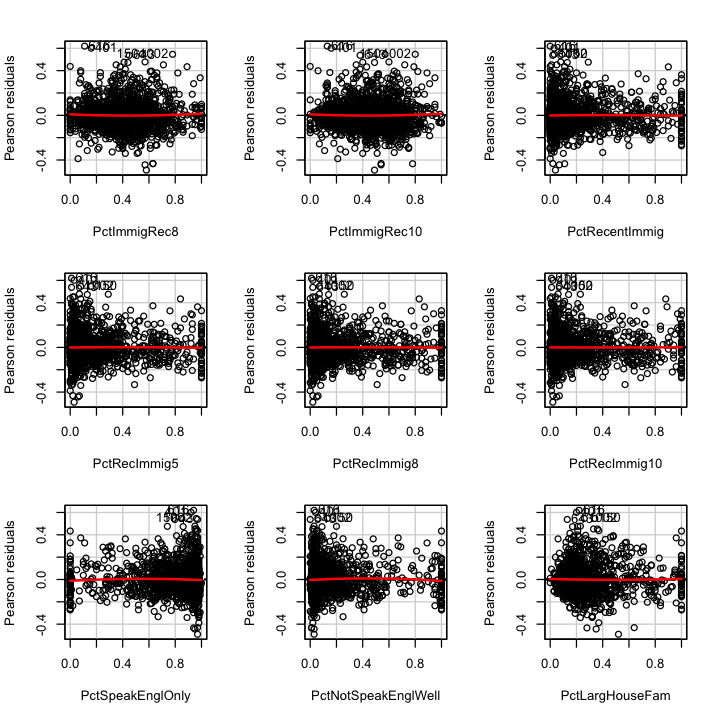

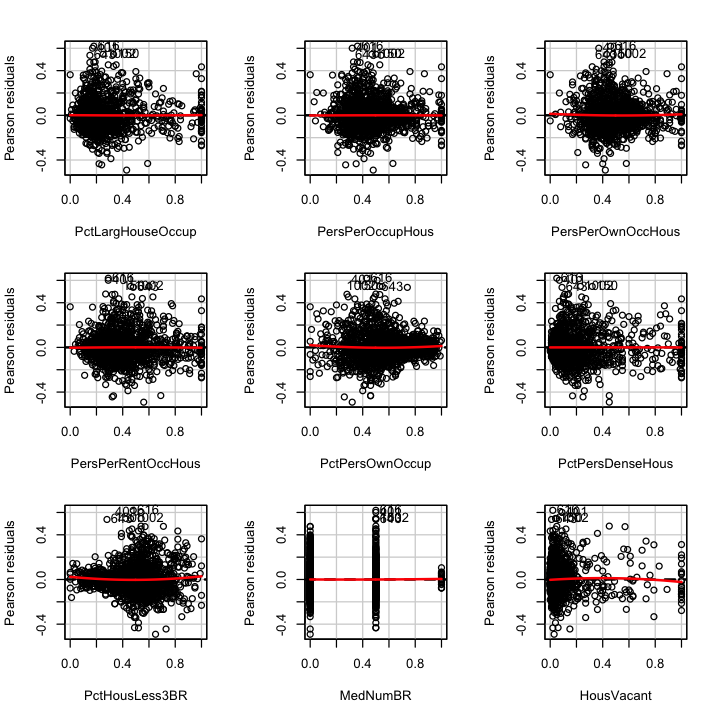

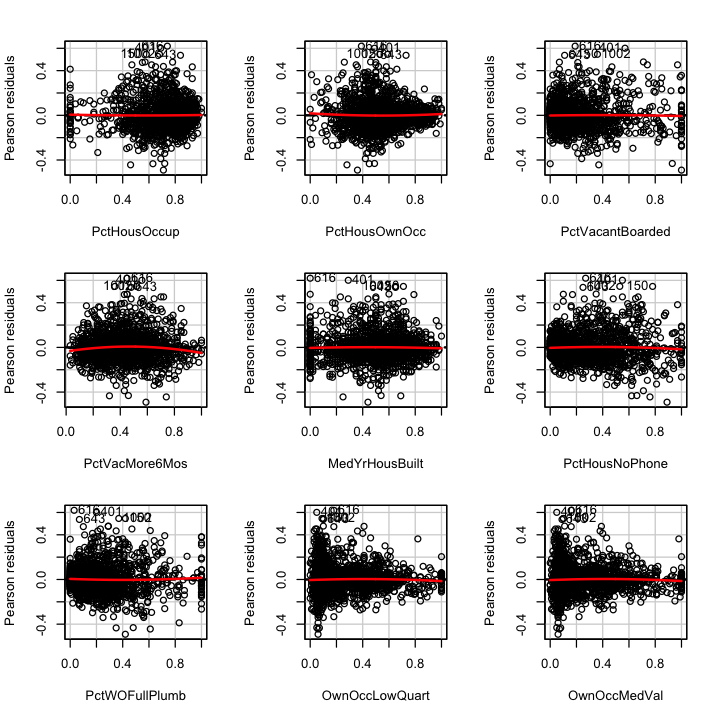

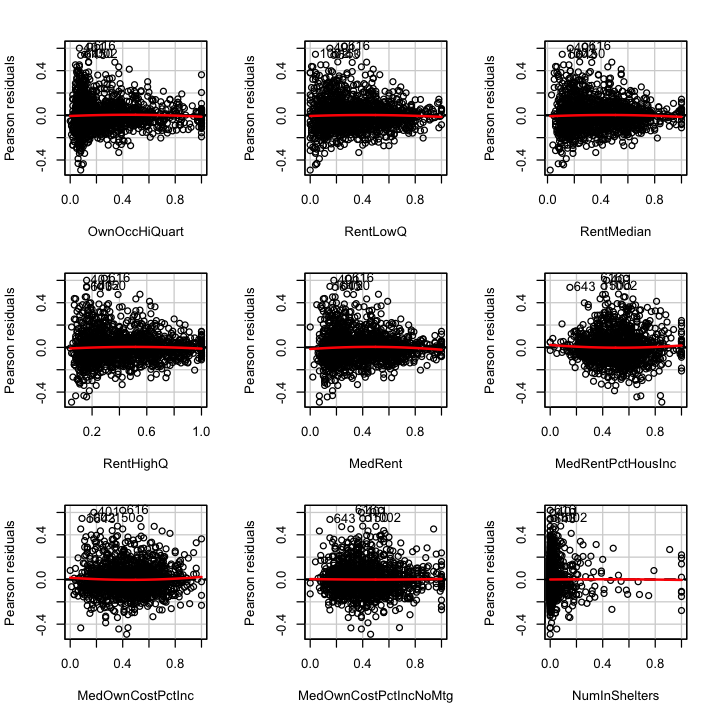

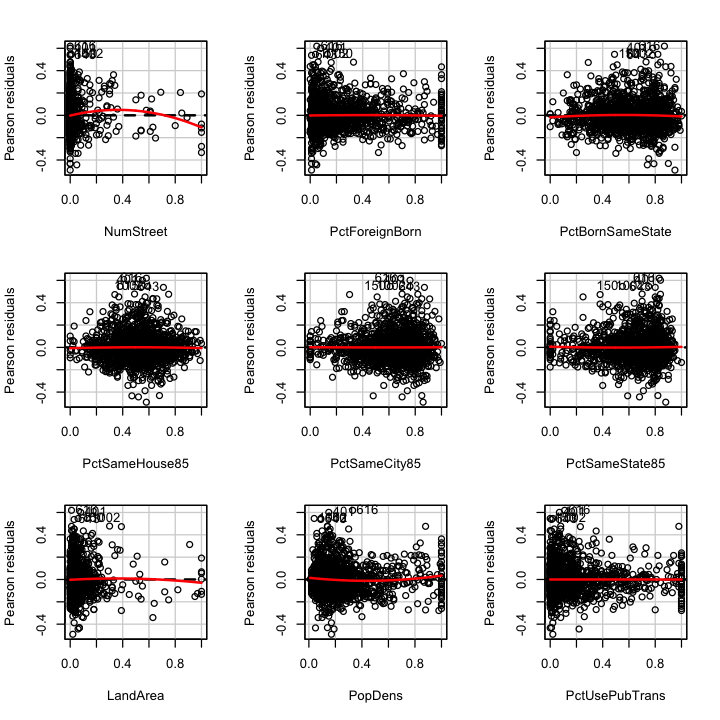

,Test stat,Pr(>|t|)
population,-1.324,0.186
householdsize,-1.726,0.085
racepctblack,-5.027,0.000
racePctWhite,-0.723,0.470
racePctAsian,-0.973,0.331
racePctHisp,-0.804,0.422
agePct12t21,-0.941,0.347
agePct12t29,-0.453,0.650
agePct16t24,-0.319,0.750
agePct65up,-0.634,0.526


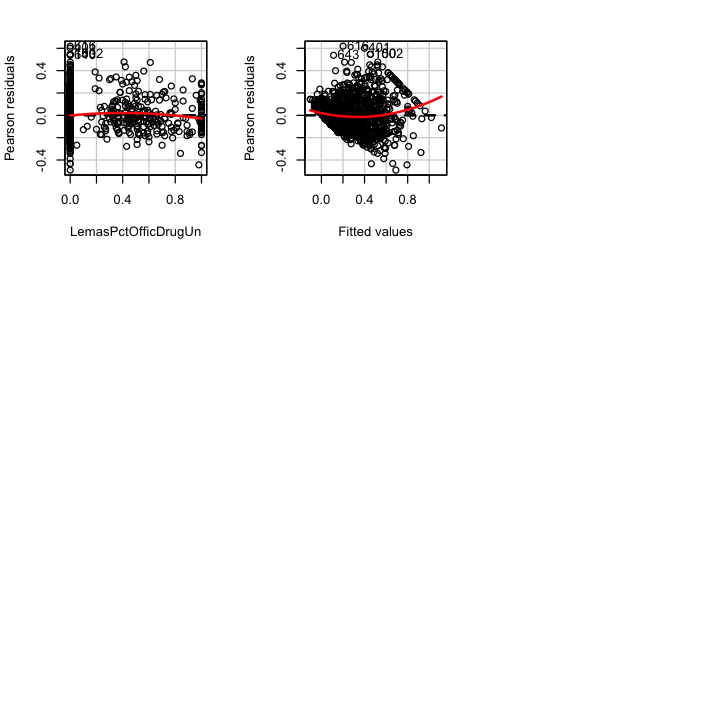

In [25]:
options(repr.plot.width=6, repr.plot.height=6)
residualPlots(model1, id.n=5)

#### Model 2

Transform some independent variables and build a model. We have gone through all the residuals vs variable plots and  box plot for these variables and transform these variables based on box plot and residual plots. R Square for second model is 71.84% and some  insignificant features are now significant.

In [26]:
trainingData$racepctblack <- trainingData$racepctblack^0.5
trainingData$racePctWhite <- trainingData$racePctWhite^0.5
trainingData$PctYoungKids2Par <- trainingData$PctYoungKids2Par^0.5
trainingData$PctIlleg <- trainingData$PctIlleg^0.5
trainingData$PctVacMore6Mos <- trainingData$PctVacMore6Mos^0.5
trainingData$population <- trainingData$population^0.5
trainingData$householdsize <- trainingData$householdsize^0.5
trainingData$blackPerCap_sq <- trainingData$blackPerCap^2
trainingData$PctEmploy <- trainingData$PctEmploy^0.5
trainingData$NumStreet_sq <- trainingData$NumStreet^2
trainingData$pctWFarmSelf_sq <- trainingData$pctWFarmSelf^2
trainingData$PctYoungKids2Par_sq <- trainingData$PctYoungKids2Par^2
trainingData$NumIlleg <- trainingData$NumIlleg^2
trainingData$NumImmig_sq <- trainingData$NumImmig^2
trainingData$PctVacMore6Mos_sq <- trainingData$PctVacMore6Mos^2
trainingData$PctWOFullPlumb_sq <- trainingData$PctWOFullPlumb^2
trainingData$MedRent <- trainingData$MedRent^0.5
trainingData$MedRentPctHousInc_sq <- trainingData$MedRentPctHousInc^2
trainingData$PopDens_sq <- trainingData$PopDens^2
trainingData$LemasPctOfficDrugUn_sq <- trainingData$LemasPctOfficDrugUn^2

model2 = lm(ViolentCrimesPerPop ~ .,trainingData)
summary(model2)


Call:
lm(formula = ViolentCrimesPerPop ~ ., data = trainingData)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.46736 -0.07381 -0.01204  0.05508  0.60861 

Coefficients:
                        Estimate Std. Error t value Pr(>|t|)    
(Intercept)             0.290103   0.243471   1.192 0.233635    
population              0.039241   0.058433   0.672 0.501970    
householdsize          -0.070791   0.131348  -0.539 0.589996    
racepctblack            0.234021   0.036003   6.500 1.09e-10 ***
racePctWhite           -0.078703   0.049944  -1.576 0.115275    
racePctAsian            0.001469   0.035272   0.042 0.966787    
racePctHisp             0.036183   0.056561   0.640 0.522456    
agePct12t21            -0.057304   0.117612  -0.487 0.626169    
agePct12t29            -0.147617   0.175552  -0.841 0.400554    
agePct16t24            -0.027505   0.180853  -0.152 0.879139    
agePct65up              0.072374   0.118099   0.613 0.540085    
numbUrban              -0.016352   

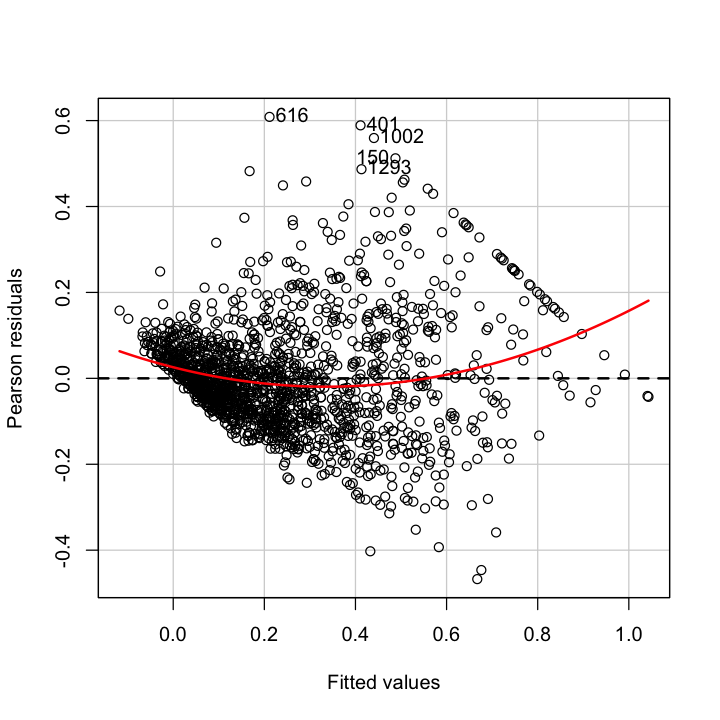

In [27]:
residualPlot(model2, id.n=5)

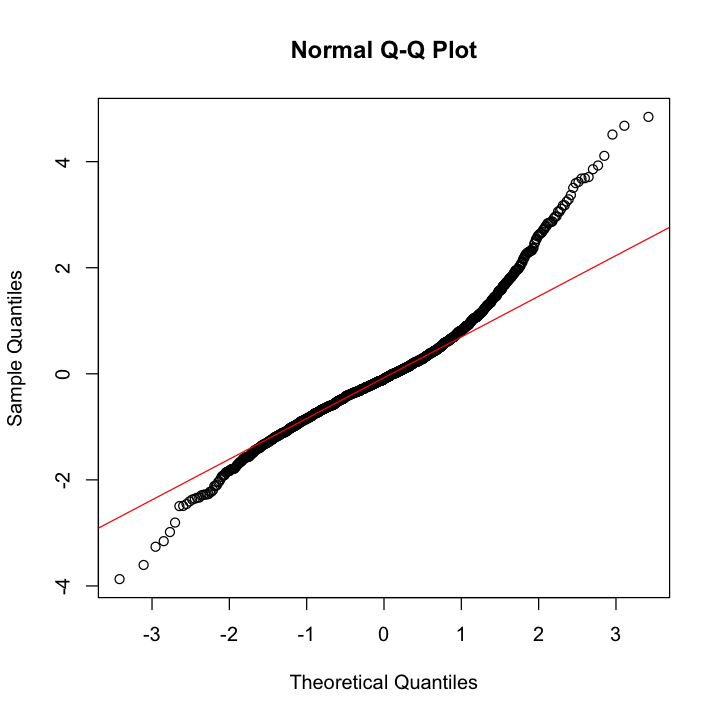

In [28]:
#QQ-plot of the residuals
qqnorm(rstandard(model2))
qqline(rstandard(model2),col="red")

##### Model 3

We can see that residuals are not normally distributed and residuals also not having equal variance. We need to tranform Y variable (i.e. ViolentCrimesPerPop). Lets transform ViolentCrimesPerPop variable after seeing boxplot of ViolentCrimesPerPop variable and build a model. This model is able to explain 75.11% variance and residuals seems normally distributed.

In [29]:
trainingData$ViolentCrimesPerPop <- trainingData$ViolentCrimesPerPop^0.5

model3 = lm(ViolentCrimesPerPop ~ .,trainingData)
summary(model3)


Call:
lm(formula = ViolentCrimesPerPop ~ ., data = trainingData)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.43434 -0.07413 -0.00724  0.06631  0.47922 

Coefficients:
                         Estimate Std. Error t value Pr(>|t|)    
(Intercept)             0.2521540  0.2186309   1.153 0.248960    
population              0.0912418  0.0524715   1.739 0.082263 .  
householdsize          -0.1425021  0.1179476  -1.208 0.227170    
racepctblack            0.2545022  0.0323299   7.872 6.68e-15 ***
racePctWhite            0.0123760  0.0448483   0.276 0.782623    
racePctAsian            0.0571657  0.0316737   1.805 0.071303 .  
racePctHisp             0.1200483  0.0507909   2.364 0.018227 *  
agePct12t21            -0.0424756  0.1056130  -0.402 0.687608    
agePct12t29            -0.0944822  0.1576417  -0.599 0.549032    
agePct16t24            -0.0032598  0.1624015  -0.020 0.983988    
agePct65up              0.1400400  0.1060501   1.321 0.186869    
numbUrban              

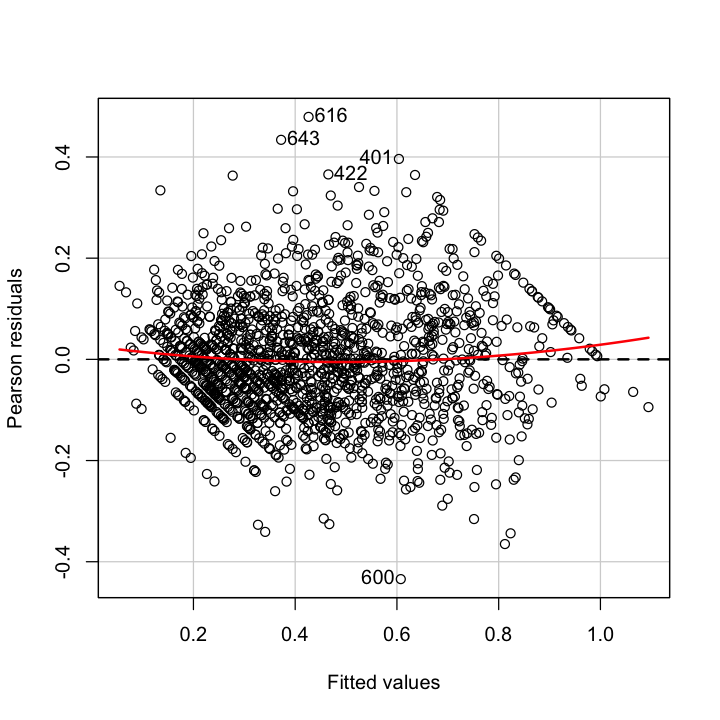

In [30]:
residualPlot(model3, id.n=5)

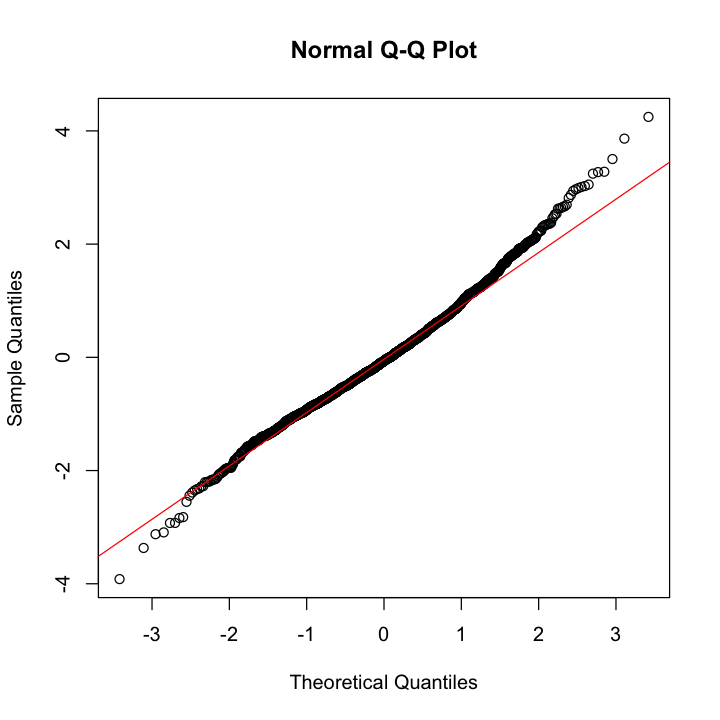

In [31]:
#QQ-plot of the residuals
qqnorm(rstandard(model3))
qqline(rstandard(model3),col="red")

#### Model 4
###### Collinearity and Selection of Independent variables

We can see from below VIF output that many predictor variables are having VIF more than 30. It means many variables are correlated with each other.

In [32]:
vif_output <- vif(model3)
print(vif_output[order(vif_output, decreasing = TRUE)])

           TotalPctDiv           OwnOccMedVal        PctPersOwnOccup 
           1060.672014             594.322378             565.799247 
         PctHousOwnOcc           PctRecImmig8           FemalePctDiv 
            540.070925             471.130883             344.264102 
          PctRecImmig5          PctRecImmig10      PctLargHouseOccup 
            339.350561             302.840308             250.945573 
        OwnOccLowQuart        PctLargHouseFam         MalePctDivorce 
            244.725250             243.137615             241.730431 
      PersPerOccupHous          OwnOccHiQuart              medIncome 
            217.529392             171.766267             158.579063 
             perCapInc              medFamInc            PctKids2Par 
            149.496451             127.607923             125.206370 
            PctFam2Par             RentMedian         PctRecentImmig 
            123.659773             105.306710             104.939303 
           whitePerC

Now, Let's check the condition indices of the correlation matrix of the predictor variables to find out which variables are stongly correlated to each other.

From the below output, we can see that following variables are strongly correlated each other:

MalePctDivorce<br>
FemalePctDiv<br>
TotalPctDiv


In [ ]:
colldiag(model3)

As many predictors are not significant in model 3 and as we have already seen that many predictors are strongly correlated with each other. Let's do variable selection method to select variables which explain maximum variation of response variable. 

We used Backward Elimination method to select variables.

Backward elimination, which starts with all predictor variables, testing the deletion of each variable using a chosen model fit criterion, deleting the variable (if any) whose squared loss gives the most statistically insignificant deterioration of the model fit, and repeating this process until no further variables can be deleted without a statistically significant loss of fit. (Source: https://en.wikipedia.org/wiki/Stepwise_regression)

In [ ]:
step <- stepAIC(model3, direction="backward")

We can see that many predictors variables are deleted.
Let's build a model (model 4) with stepAIC final output.

R-squared is 0.7461 for model 4 and all independent variables are significant. 

In [33]:
model4 = lm(ViolentCrimesPerPop ~ population + householdsize + racepctblack + 
    racePctAsian + racePctHisp + agePct12t29 + agePct65up + pctUrban + 
    pctWWage + pctWFarmSelf + pctWInvInc + pctWRetire + medFamInc + 
    perCapInc + blackPerCap + AsianPerCap + PctPopUnderPov + 
    PctEmploy + PctEmplManu + PctEmplProfServ + MalePctDivorce + 
    MalePctNevMarr + PersPerFam + PctFam2Par + PctYoungKids2Par + 
    PctWorkMom + NumIlleg + NumImmig + PctRecImmig8 + PctRecImmig10 + 
    PctNotSpeakEnglWell + PersPerOccupHous + PersPerRentOccHous + 
    PctPersOwnOccup + PctPersDenseHous + PctHousOccup + PctHousOwnOcc + 
    PctVacMore6Mos + PctWOFullPlumb + OwnOccLowQuart + OwnOccHiQuart + 
    RentLowQ + MedRent + MedRentPctHousInc + MedOwnCostPctIncNoMtg + 
    NumInShelters + NumStreet + PctForeignBorn + PctSameCity85 + 
    PopDens + PctUsePubTrans + LemasPctOfficDrugUn + blackPerCap_sq + 
    NumStreet_sq + pctWFarmSelf_sq + PctYoungKids2Par_sq + NumImmig_sq + 
    PctVacMore6Mos_sq + PctWOFullPlumb_sq + MedRentPctHousInc_sq + 
    PopDens_sq + LemasPctOfficDrugUn_sq, trainingData)

summary(model4)


Call:
lm(formula = ViolentCrimesPerPop ~ population + householdsize + 
    racepctblack + racePctAsian + racePctHisp + agePct12t29 + 
    agePct65up + pctUrban + pctWWage + pctWFarmSelf + pctWInvInc + 
    pctWRetire + medFamInc + perCapInc + blackPerCap + AsianPerCap + 
    PctPopUnderPov + PctEmploy + PctEmplManu + PctEmplProfServ + 
    MalePctDivorce + MalePctNevMarr + PersPerFam + PctFam2Par + 
    PctYoungKids2Par + PctWorkMom + NumIlleg + NumImmig + PctRecImmig8 + 
    PctRecImmig10 + PctNotSpeakEnglWell + PersPerOccupHous + 
    PersPerRentOccHous + PctPersOwnOccup + PctPersDenseHous + 
    PctHousOccup + PctHousOwnOcc + PctVacMore6Mos + PctWOFullPlumb + 
    OwnOccLowQuart + OwnOccHiQuart + RentLowQ + MedRent + MedRentPctHousInc + 
    MedOwnCostPctIncNoMtg + NumInShelters + NumStreet + PctForeignBorn + 
    PctSameCity85 + PopDens + PctUsePubTrans + LemasPctOfficDrugUn + 
    blackPerCap_sq + NumStreet_sq + pctWFarmSelf_sq + PctYoungKids2Par_sq + 
    NumImmig_sq + PctVacMor

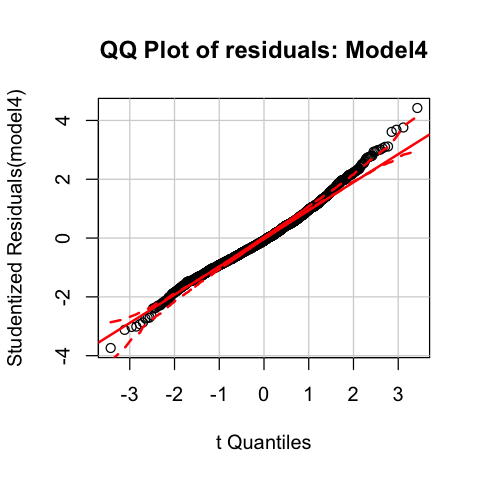

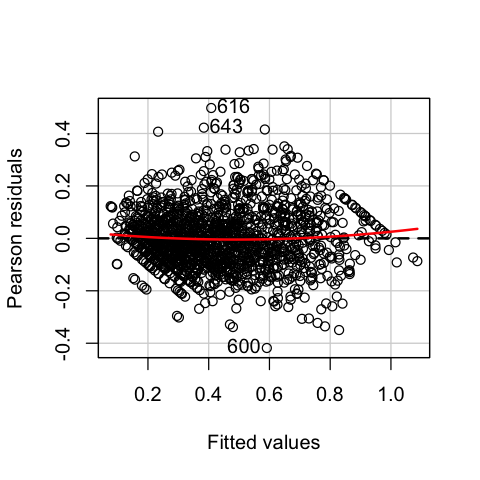

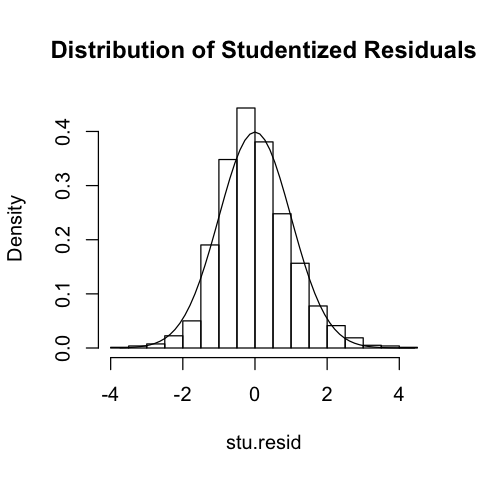

In [34]:
options(repr.plot.width=4, repr.plot.height=4)
qqPlot(model4, main="QQ Plot of residuals: Model4")

residualPlot(model4, id.n = 3)

options(repr.plot.width=4, repr.plot.height=4)
stu.resid <- studres(model4) 
hist(stu.resid, freq=FALSE, main="Distribution of Studentized Residuals") 
xfit<-seq(min(stu.resid),max(stu.resid),length=60)
yfit<-dnorm(xfit)
lines(xfit, yfit)

#### Model 4.1
##### Check influential observations

Now let's delete the influential observation and build a model(model4.1) on stepAIC output. Following are influential observations in the training data.<br>
343<br>
463<br>
565<br>
1685

Let's delete these observation and rebuild model 4 again. This model is able to explain 74.92% variation and most variables are significant.

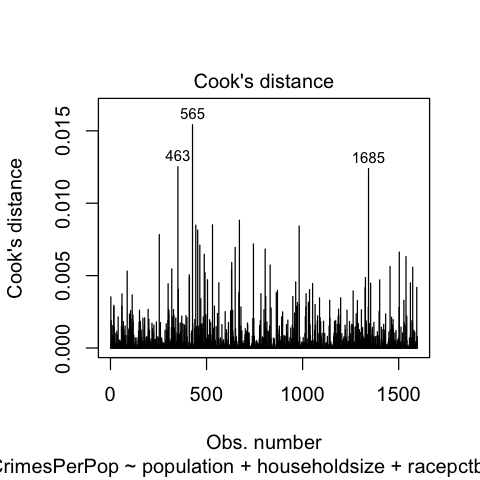

In [35]:
cutoff <- 4/((nrow(trainingData)-length(model4$coefficients)-2)) 
plot(model4, which=4, cook.levels=cutoff)


Call:
lm(formula = ViolentCrimesPerPop ~ population + householdsize + 
    racepctblack + racePctAsian + racePctHisp + agePct12t29 + 
    agePct65up + pctUrban + pctWWage + pctWFarmSelf + pctWInvInc + 
    pctWRetire + medFamInc + perCapInc + blackPerCap + AsianPerCap + 
    PctPopUnderPov + PctEmploy + PctEmplManu + PctEmplProfServ + 
    MalePctDivorce + MalePctNevMarr + PersPerFam + PctFam2Par + 
    PctYoungKids2Par + PctWorkMom + NumIlleg + NumImmig + PctRecImmig8 + 
    PctRecImmig10 + PctNotSpeakEnglWell + PersPerOccupHous + 
    PersPerRentOccHous + PctPersOwnOccup + PctPersDenseHous + 
    PctHousOccup + PctHousOwnOcc + PctVacMore6Mos + PctWOFullPlumb + 
    OwnOccLowQuart + OwnOccHiQuart + RentLowQ + MedRent + MedRentPctHousInc + 
    MedOwnCostPctIncNoMtg + NumInShelters + NumStreet + PctForeignBorn + 
    PctSameCity85 + PopDens + PctUsePubTrans + LemasPctOfficDrugUn + 
    blackPerCap_sq + NumStreet_sq + pctWFarmSelf_sq + PctYoungKids2Par_sq + 
    NumImmig_sq + PctVacMor

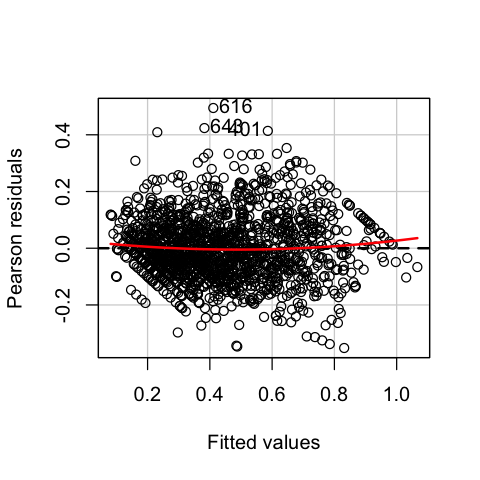

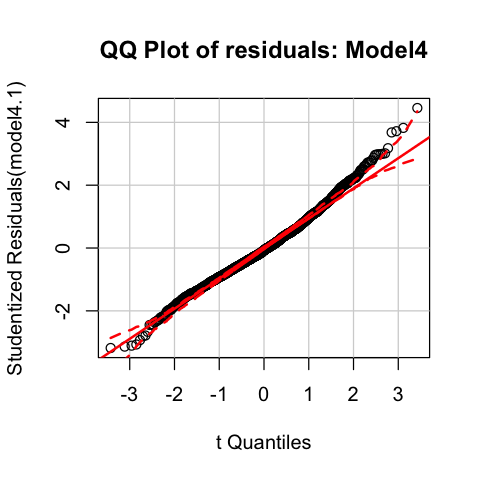

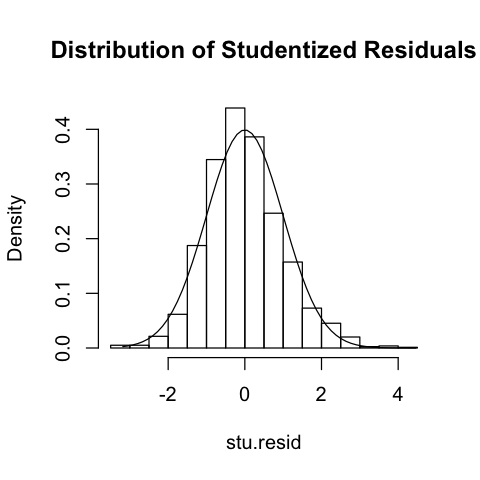

In [36]:
trainingRowIndex1 <- train.index[train.index != 343 & train.index != 565 & 
                                 train.index != 1231 & train.index != 463 & train.index != 600 &
                                 train.index != 862 & train.index != 1685]
trainingData1 <- Ndata[unlist(trainingRowIndex1),]

trainingData1$racepctblack <- trainingData1$racepctblack^0.5
trainingData1$racePctWhite <- trainingData1$racePctWhite^0.5
trainingData1$PctYoungKids2Par <- trainingData1$PctYoungKids2Par^0.5
trainingData1$PctIlleg <- trainingData1$PctIlleg^0.5
trainingData1$PctVacMore6Mos <- trainingData1$PctVacMore6Mos^0.5
trainingData1$population <- trainingData1$population^0.5
trainingData1$householdsize <- trainingData1$householdsize^0.5
trainingData1$blackPerCap_sq <- trainingData1$blackPerCap^2
trainingData1$PctEmploy <- trainingData1$PctEmploy^0.5
trainingData1$NumStreet_sq <- trainingData1$NumStreet^2
trainingData1$pctWFarmSelf_sq <- trainingData1$pctWFarmSelf^2
trainingData1$PctYoungKids2Par_sq <- trainingData1$PctYoungKids2Par^2
trainingData1$NumIlleg <- trainingData1$NumIlleg^2
trainingData1$NumImmig_sq <- trainingData1$NumImmig^2
trainingData1$PctVacMore6Mos_sq <- trainingData1$PctVacMore6Mos^2
trainingData1$PctWOFullPlumb_sq <- trainingData1$PctWOFullPlumb^2
trainingData1$MedRent <- trainingData1$MedRent^0.5
trainingData1$MedRentPctHousInc_sq <- trainingData1$MedRentPctHousInc^2
trainingData1$PopDens_sq <- trainingData1$PopDens^2
trainingData1$LemasPctOfficDrugUn_sq <- trainingData1$LemasPctOfficDrugUn^2
trainingData1$ViolentCrimesPerPop <- trainingData1$ViolentCrimesPerPop^0.5

model4.1 = lm(ViolentCrimesPerPop ~ population + householdsize + racepctblack + 
    racePctAsian + racePctHisp + agePct12t29 + agePct65up + pctUrban + 
    pctWWage + pctWFarmSelf + pctWInvInc + pctWRetire + medFamInc + 
    perCapInc + blackPerCap + AsianPerCap + PctPopUnderPov + 
    PctEmploy + PctEmplManu + PctEmplProfServ + MalePctDivorce + 
    MalePctNevMarr + PersPerFam + PctFam2Par + PctYoungKids2Par + 
    PctWorkMom + NumIlleg + NumImmig + PctRecImmig8 + PctRecImmig10 + 
    PctNotSpeakEnglWell + PersPerOccupHous + PersPerRentOccHous + 
    PctPersOwnOccup + PctPersDenseHous + PctHousOccup + PctHousOwnOcc + 
    PctVacMore6Mos + PctWOFullPlumb + OwnOccLowQuart + OwnOccHiQuart + 
    RentLowQ + MedRent + MedRentPctHousInc + MedOwnCostPctIncNoMtg + 
    NumInShelters + NumStreet + PctForeignBorn + PctSameCity85 + 
    PopDens + PctUsePubTrans + LemasPctOfficDrugUn + blackPerCap_sq + 
    NumStreet_sq + pctWFarmSelf_sq + PctYoungKids2Par_sq + NumImmig_sq + 
    PctVacMore6Mos_sq + PctWOFullPlumb_sq + MedRentPctHousInc_sq + 
    PopDens_sq + LemasPctOfficDrugUn_sq, trainingData1)

summary(model4.1)

residualPlot(model4.1, id.n = 3)

options(repr.plot.width=4, repr.plot.height=4)
qqPlot(model4.1, main="QQ Plot of residuals: Model4")

options(repr.plot.width=4, repr.plot.height=4)
stu.resid <- studres(model4.1) 
hist(stu.resid, freq=FALSE, main="Distribution of Studentized Residuals") 
xfit<-seq(min(stu.resid),max(stu.resid),length=60)
yfit<-dnorm(xfit)
lines(xfit, yfit)

#### Validation

Now check Model accuracy on validation data.

In [37]:
validationData1 <- validationData
validationData1$racepctblack <- validationData1$racepctblack^0.5
validationData1$racePctWhite <- validationData1$racePctWhite^0.5
validationData1$PctYoungKids2Par <- validationData1$PctYoungKids2Par^0.5
validationData1$PctIlleg <- validationData1$PctIlleg^0.5
validationData1$PctVacMore6Mos <- validationData1$PctVacMore6Mos^0.5
validationData1$population <- validationData1$population^0.5
validationData1$householdsize <- validationData1$householdsize^0.5
validationData1$blackPerCap_sq <- validationData1$blackPerCap^2
validationData1$PctEmploy <- validationData1$PctEmploy^0.5
validationData1$NumStreet_sq <- validationData1$NumStreet^2
validationData1$pctWFarmSelf_sq <- validationData1$pctWFarmSelf^2
validationData1$PctYoungKids2Par_sq <- validationData1$PctYoungKids2Par^2
validationData1$NumIlleg <- validationData1$NumIlleg^2
validationData1$NumImmig_sq <- validationData1$NumImmig^2
validationData1$PctVacMore6Mos_sq <- validationData1$PctVacMore6Mos^2
validationData1$PctWOFullPlumb_sq <- validationData1$PctWOFullPlumb^2
validationData1$MedRent <- validationData1$MedRent^0.5
validationData1$MedRentPctHousInc_sq <- validationData1$MedRentPctHousInc^2
validationData1$PopDens_sq <- validationData1$PopDens^2
validationData1$LemasPctOfficDrugUn_sq <- validationData1$LemasPctOfficDrugUn^2

y_hat <- predict.lm(model4.1, newdata = validationData1, se.fit = TRUE)$fit
y_hat <- as.vector(y_hat)

dev <- validationData1$ViolentCrimesPerPop^0.5 - y_hat
num <- sum(dev^2, na.rm = TRUE)

print(paste("RMSE: ", sqrt(mean(dev^2))))

dev1 <- validationData1$ViolentCrimesPerPop - mean(validationData1$ViolentCrimesPerPop,na.rm = T)
den <- sum(dev1^2, na.rm = TRUE)

Predicted.Rsq <- 1 - (num/den)
print(paste("R Square: ", Predicted.Rsq))

[1] "RMSE:  0.127691505925501"
[1] "R Square:  0.699173459430908"


#### Model 4.2

If we transform ViolentCrimesPerPop as ViolentCrimesPerPop^0.35, then residuals seems distributed normally and also there is no pattern left in residual plot. We can see from below boxplot that ViolentCrimesPerPop^0.35 seems normal.

This model is able to explain 74.58% variation of target variable. RMSE and R-Square for validation data is very high compare than above model.

RMSE:  0.11405979773682<br>
R Square:  0.759974531525303

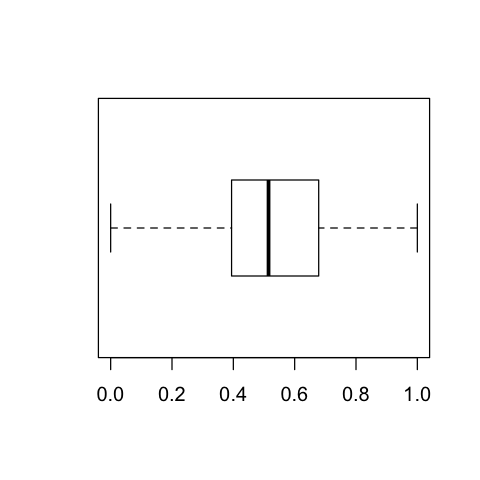

In [38]:
boxplot(Ndata$ViolentCrimesPerPop^0.35,horizontal = T)


Call:
lm(formula = ViolentCrimesPerPop ~ population + householdsize + 
    racepctblack + racePctAsian + racePctHisp + agePct12t29 + 
    agePct65up + pctUrban + pctWWage + pctWFarmSelf + pctWInvInc + 
    pctWRetire + medFamInc + perCapInc + blackPerCap + AsianPerCap + 
    PctPopUnderPov + PctEmploy + PctEmplManu + PctEmplProfServ + 
    MalePctDivorce + MalePctNevMarr + PersPerFam + PctFam2Par + 
    PctYoungKids2Par + PctWorkMom + NumIlleg + NumImmig + PctRecImmig8 + 
    PctRecImmig10 + PctNotSpeakEnglWell + PersPerOccupHous + 
    PersPerRentOccHous + PctPersOwnOccup + PctPersDenseHous + 
    PctHousOccup + PctHousOwnOcc + PctVacMore6Mos + PctWOFullPlumb + 
    OwnOccLowQuart + OwnOccHiQuart + RentLowQ + MedRent + MedRentPctHousInc + 
    MedOwnCostPctIncNoMtg + NumInShelters + NumStreet + PctForeignBorn + 
    PctSameCity85 + PopDens + PctUsePubTrans + LemasPctOfficDrugUn + 
    blackPerCap_sq + NumStreet_sq + pctWFarmSelf_sq + PctYoungKids2Par_sq + 
    NumImmig_sq + PctVacMor

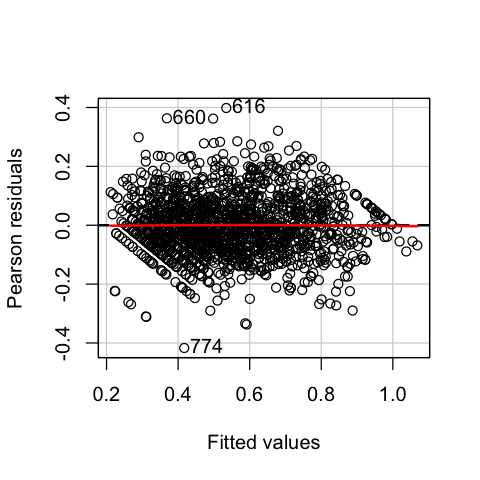

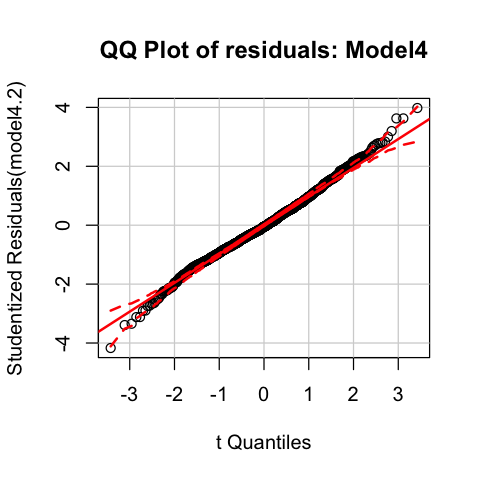

[1] "RMSE:  0.11405979773682"
[1] "R Square:  0.759974531525303"


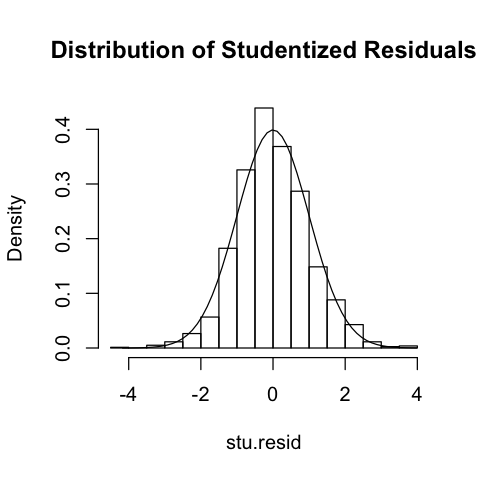

In [39]:
trainingRowIndex1 <- train.index[train.index != 343 & train.index != 565 & 
                                 train.index != 1231 & train.index != 463 & train.index != 600 &
                                 train.index != 862 & train.index != 1685]
trainingData1 <- Ndata[unlist(trainingRowIndex1),]

trainingData1$racepctblack <- trainingData1$racepctblack^0.5
trainingData1$racePctWhite <- trainingData1$racePctWhite^0.5
trainingData1$PctYoungKids2Par <- trainingData1$PctYoungKids2Par^0.5
trainingData1$PctIlleg <- trainingData1$PctIlleg^0.5
trainingData1$PctVacMore6Mos <- trainingData1$PctVacMore6Mos^0.5
trainingData1$population <- trainingData1$population^0.5
trainingData1$householdsize <- trainingData1$householdsize^0.5
trainingData1$blackPerCap_sq <- trainingData1$blackPerCap^2
trainingData1$PctEmploy <- trainingData1$PctEmploy^0.5
trainingData1$NumStreet_sq <- trainingData1$NumStreet^2
trainingData1$pctWFarmSelf_sq <- trainingData1$pctWFarmSelf^2
trainingData1$PctYoungKids2Par_sq <- trainingData1$PctYoungKids2Par^2
trainingData1$NumIlleg <- trainingData1$NumIlleg^2
trainingData1$NumImmig_sq <- trainingData1$NumImmig^2
trainingData1$PctVacMore6Mos_sq <- trainingData1$PctVacMore6Mos^2
trainingData1$PctWOFullPlumb_sq <- trainingData1$PctWOFullPlumb^2
trainingData1$MedRent <- trainingData1$MedRent^0.5
trainingData1$MedRentPctHousInc_sq <- trainingData1$MedRentPctHousInc^2
trainingData1$PopDens_sq <- trainingData1$PopDens^2
trainingData1$LemasPctOfficDrugUn_sq <- trainingData1$LemasPctOfficDrugUn^2
trainingData1$ViolentCrimesPerPop <- trainingData1$ViolentCrimesPerPop^0.35

model4.2 = lm(ViolentCrimesPerPop ~ population + householdsize + racepctblack + 
    racePctAsian + racePctHisp + agePct12t29 + agePct65up + pctUrban + 
    pctWWage + pctWFarmSelf + pctWInvInc + pctWRetire + medFamInc + 
    perCapInc + blackPerCap + AsianPerCap + PctPopUnderPov + 
    PctEmploy + PctEmplManu + PctEmplProfServ + MalePctDivorce + 
    MalePctNevMarr + PersPerFam + PctFam2Par + PctYoungKids2Par + 
    PctWorkMom + NumIlleg + NumImmig + PctRecImmig8 + PctRecImmig10 + 
    PctNotSpeakEnglWell + PersPerOccupHous + PersPerRentOccHous + 
    PctPersOwnOccup + PctPersDenseHous + PctHousOccup + PctHousOwnOcc + 
    PctVacMore6Mos + PctWOFullPlumb + OwnOccLowQuart + OwnOccHiQuart + 
    RentLowQ + MedRent + MedRentPctHousInc + MedOwnCostPctIncNoMtg + 
    NumInShelters + NumStreet + PctForeignBorn + PctSameCity85 + 
    PopDens + PctUsePubTrans + LemasPctOfficDrugUn + blackPerCap_sq + 
    NumStreet_sq + pctWFarmSelf_sq + PctYoungKids2Par_sq + NumImmig_sq + 
    PctVacMore6Mos_sq + PctWOFullPlumb_sq + MedRentPctHousInc_sq + 
    PopDens_sq + LemasPctOfficDrugUn_sq, trainingData1)

summary(model4.2)

residualPlot(model4.2, id.n = 3)

options(repr.plot.width=4, repr.plot.height=4)
qqPlot(model4.2, main="QQ Plot of residuals: Model4")

options(repr.plot.width=4, repr.plot.height=4)
stu.resid <- studres(model4.2) 
hist(stu.resid, freq=FALSE, main="Distribution of Studentized Residuals") 
xfit<-seq(min(stu.resid),max(stu.resid),length=60)
yfit<-dnorm(xfit)
lines(xfit, yfit)

#Validation

validationData1 <- validationData
validationData1$racepctblack <- validationData1$racepctblack^0.5
validationData1$racePctWhite <- validationData1$racePctWhite^0.5
validationData1$PctYoungKids2Par <- validationData1$PctYoungKids2Par^0.5
validationData1$PctIlleg <- validationData1$PctIlleg^0.5
validationData1$PctVacMore6Mos <- validationData1$PctVacMore6Mos^0.5
validationData1$population <- validationData1$population^0.5
validationData1$householdsize <- validationData1$householdsize^0.5
validationData1$blackPerCap_sq <- validationData1$blackPerCap^2
validationData1$PctEmploy <- validationData1$PctEmploy^0.5
validationData1$NumStreet_sq <- validationData1$NumStreet^2
validationData1$pctWFarmSelf_sq <- validationData1$pctWFarmSelf^2
validationData1$PctYoungKids2Par_sq <- validationData1$PctYoungKids2Par^2
validationData1$NumIlleg <- validationData1$NumIlleg^2
validationData1$NumImmig_sq <- validationData1$NumImmig^2
validationData1$PctVacMore6Mos_sq <- validationData1$PctVacMore6Mos^2
validationData1$PctWOFullPlumb_sq <- validationData1$PctWOFullPlumb^2
validationData1$MedRent <- validationData1$MedRent^0.5
validationData1$MedRentPctHousInc_sq <- validationData1$MedRentPctHousInc^2
validationData1$PopDens_sq <- validationData1$PopDens^2
validationData1$LemasPctOfficDrugUn_sq <- validationData1$LemasPctOfficDrugUn^2


y_hat <- predict.lm(model4.2, newdata = validationData1, se.fit = TRUE)$fit
y_hat <- as.vector(y_hat)

dev <- validationData1$ViolentCrimesPerPop^0.35 - y_hat
num <- sum(dev^2, na.rm = TRUE)

print(paste("RMSE: ", sqrt(mean(dev^2))))

dev1 <- validationData1$ViolentCrimesPerPop - mean(validationData1$ViolentCrimesPerPop,na.rm = T)
den <- sum(dev1^2, na.rm = TRUE)

Predicted.Rsq <- 1 - (num/den)
print(paste("R Square: ", Predicted.Rsq))


#### PCR

As there are many independent variables, lets apply PCR on this dataset.

We trained PCR on training data and used 20 Principle components to predict ViolentCrimesPerPop for validation data. RMSE for this model is: 0.145736981512293

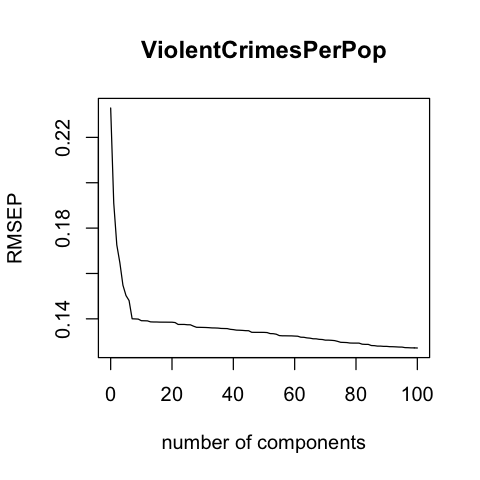

[1] "RMSE  0.145736981512293"


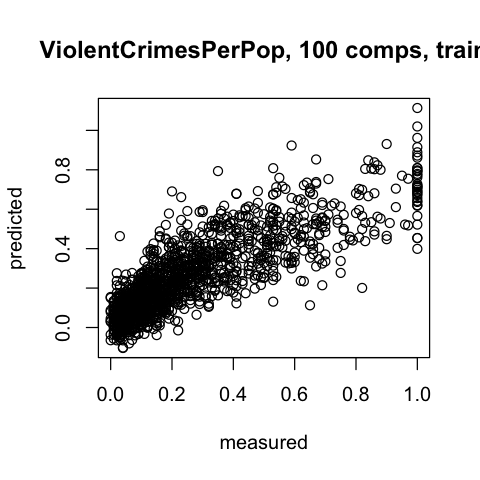

In [40]:
train <- Ndata[unlist(train.index),]
y_actual <- Ndata[-unlist(train.index),101]
test <- Ndata[-unlist(train.index),-101]

community.mvr <- pcr(ViolentCrimesPerPop~., data = train)
#summary(community.mvr)

validationplot(community.mvr)

predplot(community.mvr)

y_predict <- predict(community.mvr, ncomp = 1:20, newdata =
                     test)

print(paste("RMSE ", sqrt(mean((y_predict - y_actual)^2))))

#### Ridge Regression

Let's apply Ridge regression on this dataset.

best lambda:  0.0196460779345214<br>
RMSE:  0.135436414052163<br>
R Square:  0.64342942147755<br>

In [41]:
grid = 10^seq(10, -2, length = 100)

set.seed(1)

train = Ndata %>%
  sample_frac(0.5)

test = Ndata %>%
  setdiff(train)

x_train = model.matrix(ViolentCrimesPerPop~., train)[,-1]
x_test = model.matrix(ViolentCrimesPerPop~., test)[,-1]

y_train = train %>%
  select(ViolentCrimesPerPop) %>%
  unlist() %>%
  as.numeric()

y_test = test %>%
  select(ViolentCrimesPerPop) %>%
  unlist() %>%
  as.numeric()

cv.out = cv.glmnet(x_train, y_train, alpha = 0) # Fit ridge regression model on training data
bestlam = cv.out$lambda.min  # Select lamda that minimizes training MSE
print(paste("best lambda: ",bestlam))

y_predicted = predict(cv.out, s = bestlam, newx = x_test) # Use best lambda to predict test data
print(paste("RMSE: ", sqrt(mean((y_predicted - y_test)^2)))) # Calculate test MSE

dev <- y_test - y_predicted
num <- sum(dev^2, na.rm = TRUE)

dev1 <- y_test - mean(y_test)
den <- sum(dev1^2, na.rm = TRUE)

Predicted.Rsq <- 1 - (num/den)
print(paste("R Square: ", Predicted.Rsq))

[1] "best lambda:  0.0196460779345214"
[1] "RMSE:  0.135436414052163"
[1] "R Square:  0.64342942147755"


#### Lasso

Let's apply Lasso regression on this dataset.

best lambda:  0.000614080571841437<br>
RMSE:  0.135696178773185<br>
R Square:  0.642060317258955<br>

In [42]:
set.seed(1)
cv.out = cv.glmnet(x_train, y_train, alpha = 1) # Fit lasso model on training data
bestlam = cv.out$lambda.min # Select lamda that minimizes training MSE
print(paste("best lambda: ",bestlam))
lasso_pred = predict(cv.out, s = bestlam, newx = x_test) # Use best lambda to predict test data
print(paste("RMSE: ", sqrt(mean((lasso_pred - y_test)^2)))) # Calculate test MSE
dev <- y_test - lasso_pred
num <- sum(dev^2, na.rm = TRUE)

dev1 <- y_test - mean(y_test)
den <- sum(dev1^2, na.rm = TRUE)

Predicted.Rsq <- 1 - (num/den)
print(paste("R Square: ", Predicted.Rsq))

[1] "best lambda:  0.000614080571841437"
[1] "RMSE:  0.135696178773185"
[1] "R Square:  0.642060317258955"
